### Model inspired by:

- [1] Offshore Pipelaying Dynamics. Gullik Anthon Jensen
- [2] A nonlinear PDE formulation for offshore vessel pipeline installation. Gullik A. Jensen et al
- [3] Modeling and Control of Offshore Pipelay Operations Based on a Finite Strain Pipe Model. Gullik A. Jensen

### Implementation aspects:

- This implementation is more like pseudo steady-state finite difference method rather than fully dynamic FEM (i.e. the model can be applied to normal dynamic pipelay condition as a rough estimate)

In [1]:
import numpy as np
import inspect
import matplotlib.pyplot as plt
import scipy
from datetime import datetime
from scipy.optimize import root
from scipy.integrate import solve_ivp
from scipy import interpolate
import plotly.graph_objects as go

In [2]:
import sys

In [3]:
sys.path.insert(0, "../../../miscellaneous/Ocean_Intella_1/PythonVehicleSimulator-master/src/python_vehicle_simulator")
sys.path.insert(0, "../../../miscellaneous/Ocean_Intella_1/PythonVehicleSimulator-master/src")

In [4]:
from python_vehicle_simulator.vehicles import *
from python_vehicle_simulator.lib import *
from python_vehicle_simulator.lib.gnc import ssa

### Modelling data:

In [5]:
mp = 59.1       #  (submerged pipe weight) [kg/m]
N = 100       # number of modelling nodes

In [6]:
mi = [mp for i in range(N)]

In [7]:
# Vessel:

# L - the hull length
# Xg - x-center of gravity

L = 168 # [m]
B = 46
H = 13.5
Xg = L/2 # [m]
mn = 39_989_000  # mass of the vessel, [kg]

In [8]:
Fx_0 = 604.76664*1000
Fy_0 = 0.7*Fx_0
LTD = 255.21207

In [9]:
lx, ly, lz = L/2, B/2, H/2

In [10]:
vessel_mass = mn/L # mass over length of the vessel

In [11]:
diag_Jrho0 = 1e2*np.array([1, 1, 2]) # [m^4] 
Jrho0 = np.diag(diag_Jrho0)

In [12]:
qw = 1025 # Water density [kg/m3]
d0 = 0.508 # Outer diameter of pipe, [m]
dI= (508-22.1*2)/1000 # Inner diameter of pipe, [m]

In [13]:
rho_steel=7850 #kg/m^3
rho_steel *= 9.81

In [14]:
Ar=np.pi*((d0/2)**2-(dI/2)**2) 
Iy_ = 1/4*np.pi*rho_steel*((d0/2)**4-(dI/2)**4)
Iz_ = 1/2*np.pi*rho_steel*((d0/2)**4-(dI/2)**4)
J_ = 1/32*np.pi*(d0**4-dI**4)

In [15]:
E = 207e9
G = 79.3e9

In [16]:
h = 40 # water depth

In [17]:
# Fossen book p.181
def vessel_inertia_moment(mn, Xg, L):
    r = 0.25*L
    Ir = mn*r**2
    Iz=mn*Xg**2 + Ir
    return Iz

In [18]:
vessel_inertia = vessel_inertia_moment(mn, Xg, L)

In [19]:
# Underwater current: 
dv1_curr = np.zeros(N)
dv2_curr = np.zeros(N)
dv3_curr = np.zeros(N)

In [20]:
# Constants: 

In [21]:
diag_DT = 1.5*np.array([1, 1, 1])
DT=np.diag(diag_DT)

In [22]:
diag_CT = 1e9*np.array([1, 1, 1 ])  
CT=np.diag(diag_CT)

In [23]:
diag_CR = 1e11*np.array([1, 1, 1])
CR=np.diag(diag_CR)

In [24]:
diag_DR = 1.5*np.array([1, 1, 1])
DR=np.diag(diag_DR)

In [25]:
# for testing:

In [26]:
φ = np.random.rand(N)
θ = np.random.rand(N)
ψ = np.random.rand(N)

In [27]:
φ

array([0.79339139, 0.78693964, 0.19355124, 0.85266088, 0.5495737 ,
       0.46290439, 0.78825397, 0.50552254, 0.88931292, 0.9016628 ,
       0.45521364, 0.57158035, 0.34388861, 0.31181472, 0.67527709,
       0.25456251, 0.31889969, 0.11315799, 0.22314912, 0.0650194 ,
       0.85137608, 0.35050135, 0.72171295, 0.83925931, 0.39267423,
       0.7380648 , 0.53750782, 0.70412095, 0.06328424, 0.43096529,
       0.5134082 , 0.37035054, 0.25247452, 0.20938402, 0.20665641,
       0.47936365, 0.44882736, 0.08707468, 0.30682931, 0.95664292,
       0.83128612, 0.91672144, 0.04386843, 0.62288648, 0.59647413,
       0.82456247, 0.35648855, 0.29274132, 0.59163488, 0.92394718,
       0.81780024, 0.1429403 , 0.25305614, 0.33106737, 0.28401533,
       0.50216652, 0.76637871, 0.68014941, 0.31212029, 0.3265281 ,
       0.93591693, 0.26142613, 0.31066564, 0.13175142, 0.55288983,
       0.35678755, 0.8066635 , 0.25856022, 0.38699769, 0.97331608,
       0.07214499, 0.7664434 , 0.45304456, 0.92383528, 0.92600

In [28]:
dφ = np.random.rand(N)
dθ = np.random.rand(N)
dψ = np.random.rand(N)

In [29]:
ddφ = np.random.rand(N)
ddθ = np.random.rand(N)
ddψ = np.random.rand(N)

In [30]:
x = np.random.rand(N)
y = np.random.rand(N)
z = np.random.rand(N)

In [31]:
dx = np.random.rand(N)
dy = np.random.rand(N)
dz = np.random.rand(N)

In [32]:
# integration parameters
tspan = (0., 50)

coefs = [1, 1, 1, 1, 1, 1]
k500 = 6
lift_reduction_factor=1
vessel_motion_calibration_coefficient = 1e3

In [33]:
# Tp=10
# z_acceleration_factor=1e-06

### Main functions:

In [34]:
def Π0(φθψ):
    φ0,θ0,ψ0=φθψ
    return np.array([[np.cos(θ0),0,np.cos(φ0)*np.sin(θ0)],
                  [0,1,-np.sin(φ0)],
                  [-np.sin(θ0),0,np.cos(φ0)*np.cos(θ0)]])

In [35]:
def Π(φ,θ,ψ):
    φθψ=np.stack((φ,θ,ψ), axis=1)
    return np.apply_along_axis(Π0, 1, φθψ)

In [36]:
Π(φ,θ,ψ)

array([[[ 9.99999717e-01,  0.00000000e+00,  5.27936787e-04],
        [ 0.00000000e+00,  1.00000000e+00, -7.12736195e-01],
        [-7.52655489e-04,  0.00000000e+00,  7.01431990e-01]],

       [[ 7.20268300e-01,  0.00000000e+00,  4.89760155e-01],
        [ 0.00000000e+00,  1.00000000e+00, -7.08195930e-01],
        [-6.93695593e-01,  0.00000000e+00,  5.08520910e-01]],

       [[ 5.50517054e-01,  0.00000000e+00,  8.19235552e-01],
        [ 0.00000000e+00,  1.00000000e+00, -1.92345032e-01],
        [-8.34823918e-01,  0.00000000e+00,  5.40237448e-01]],

       [[ 9.30932336e-01,  0.00000000e+00,  2.40289478e-01],
        [ 0.00000000e+00,  1.00000000e+00, -7.53033880e-01],
        [-3.65191710e-01,  0.00000000e+00,  6.12536482e-01]],

       [[ 9.68532676e-01,  0.00000000e+00,  2.12237225e-01],
        [ 0.00000000e+00,  1.00000000e+00, -5.22323751e-01],
        [-2.48886432e-01,  0.00000000e+00,  8.25913591e-01]],

       [[ 5.87297220e-01,  0.00000000e+00,  7.24192556e-01],
        [ 0.00

In [37]:
def w_e(φ,θ,ψ,dφ,dθ,dψ): 
    return np.einsum('ijk,ik->ij', Π(φ,θ,ψ), np.stack((dφ,dθ,dψ), axis=1))

In [38]:
w_e(φ,θ,ψ,dφ,dθ,dψ)

array([[ 7.17725806e-01,  3.45080852e-01,  4.41856937e-01],
       [ 8.01780409e-01, -6.68272779e-02, -8.22280866e-02],
       [ 9.31616837e-01,  2.03097353e-01, -1.74678085e-01],
       [ 3.20121738e-01,  4.58967077e-01,  3.55499712e-01],
       [ 7.75382884e-01,  5.86101487e-01,  3.43380285e-01],
       [ 1.44780146e-01,  6.22057796e-01,  6.09376359e-02],
       [ 5.73043144e-01, -1.48316121e-01,  1.47130857e-02],
       [ 3.17114321e-01,  4.46780419e-01, -6.91361171e-02],
       [ 6.70874098e-01, -2.67779759e-01,  4.94376406e-01],
       [ 6.61164287e-01, -8.36396305e-02,  2.52362863e-01],
       [ 1.01845295e+00,  5.72906765e-01, -1.85972499e-01],
       [ 1.74847490e-01,  7.00957407e-01, -1.77138501e-01],
       [ 3.31414571e-01, -5.60432823e-02,  7.30721630e-01],
       [ 5.47282244e-01,  8.34459990e-01, -4.65982298e-02],
       [ 4.44395924e-01,  5.66373482e-02, -6.02855218e-01],
       [ 4.97395873e-01,  3.41576822e-01,  1.28182764e-01],
       [ 4.12205713e-02,  9.68895393e-01

In [39]:
def dw_e(φ,θ,ψ,dφ,dθ,dψ,ddφ,ddθ,ddψ):
    return (np.einsum('ijk,ik->ij', Π(φ,θ,ψ), np.stack((ddφ,ddθ,ddψ), axis=1))+
        np.einsum('ijk,ik->ij', Π(dφ,dθ,dψ), np.stack((dφ,dθ,dψ), axis=1)))

In [40]:
dw_e(φ,θ,ψ,dφ,dθ,dψ,ddφ,ddθ,ddψ)

array([[ 1.0965414 ,  0.68387107,  0.15311377],
       [ 1.25852855,  0.27980687,  0.25077831],
       [ 1.39343549,  0.79144573,  0.34626564],
       [ 1.57960703,  0.40971927,  0.3995178 ],
       [ 1.10901044,  0.97054639,  0.10188063],
       [ 0.91802589,  1.1907292 , -0.28323845],
       [ 1.55223317, -0.48350472,  0.54720077],
       [ 1.31147684,  1.21322336, -0.0993353 ],
       [ 1.24574743,  0.81869808,  0.38906041],
       [ 1.25390567, -0.24021702,  0.76337038],
       [ 1.50480595,  0.75049422, -0.7733581 ],
       [ 0.6895607 ,  1.2412177 ,  0.07632802],
       [ 0.57565878,  0.7037062 ,  1.27209196],
       [ 1.33313334,  0.91235607, -0.59198542],
       [ 1.52511287,  0.49720952, -0.01440081],
       [ 0.75601448,  1.27882339,  0.18284723],
       [ 0.46430727,  1.1440446 , -0.03836272],
       [ 1.2964943 ,  0.80900675,  0.51816043],
       [ 1.90383918,  0.55556807,  0.87080045],
       [ 1.49576267,  0.57702027,  0.10628295],
       [ 1.53951634, -0.56394679,  0.175

In [41]:
def phi(x,y,z): return np.stack((x,y,z), axis=1) 
def theta(φ,θ,ψ): return np.stack((φ,θ,ψ), axis=1) 

In [42]:
phi(x,y,z)

array([[2.62569454e-01, 2.68398449e-01, 2.21967460e-01],
       [8.80968320e-01, 4.57589129e-01, 5.72286327e-04],
       [9.06433873e-01, 8.04490211e-01, 1.86164064e-02],
       [4.44958317e-01, 6.34497363e-01, 2.86843202e-02],
       [4.20034039e-01, 5.54180452e-01, 4.29834465e-01],
       [8.85302244e-01, 5.62086281e-01, 2.27695982e-01],
       [6.26427529e-01, 3.57898203e-01, 7.20328566e-01],
       [3.05015769e-01, 2.37472570e-01, 7.84871658e-01],
       [5.74129174e-01, 5.01315053e-01, 2.45255988e-01],
       [3.86011400e-01, 5.26821304e-01, 8.41103447e-01],
       [4.29449851e-01, 8.69432048e-01, 4.34014432e-01],
       [5.72315557e-01, 2.81603844e-01, 2.92286263e-01],
       [1.97314931e-01, 4.27332252e-01, 3.75587099e-01],
       [6.50030810e-01, 3.04587988e-01, 6.30295300e-01],
       [4.51697601e-01, 9.99709695e-01, 1.05038543e-01],
       [3.17478216e-02, 2.74942562e-01, 8.15464574e-01],
       [4.69507915e-02, 4.02305315e-01, 7.52974841e-01],
       [8.63397155e-01, 3.21542

In [43]:
theta(φ,θ,ψ)

array([[7.93391388e-01, 7.52655560e-04, 9.12776416e-01],
       [7.86939641e-01, 7.66607316e-01, 3.76091028e-01],
       [1.93551242e-01, 9.87812858e-01, 1.64367911e-02],
       [8.52660881e-01, 3.73838728e-01, 8.89698956e-01],
       [5.49573701e-01, 2.51530338e-01, 7.57991905e-01],
       [4.62904392e-01, 9.43080905e-01, 1.13904684e-01],
       [7.88253965e-01, 3.72212719e-01, 7.24710944e-01],
       [5.05522543e-01, 3.13993225e-01, 3.21274937e-01],
       [8.89312917e-01, 1.52679591e-01, 2.86566468e-01],
       [9.01662797e-01, 5.92928206e-01, 3.17472346e-01],
       [4.55213641e-01, 6.03787054e-01, 5.74967785e-01],
       [5.71580354e-01, 9.30649080e-01, 6.62196631e-01],
       [3.43888609e-01, 1.21804653e-01, 3.17300830e-01],
       [3.11814716e-01, 7.40248784e-01, 7.16428387e-01],
       [6.75277088e-01, 9.95107149e-01, 4.30507438e-01],
       [2.54562506e-01, 9.89534314e-01, 5.80380059e-01],
       [3.18899689e-01, 9.92691937e-01, 4.75144151e-01],
       [1.13157990e-01, 6.60986

In [44]:
def ω(φ,θ,ψ): 
    return np.einsum('ijk,ik->ij', Π(φ,θ,ψ), theta(φ,θ,ψ))

In [45]:
ω(x,y,z)

array([[ 0.31001419,  0.21078396,  0.13705489],
       [ 0.79049537,  0.45714769, -0.38887322],
       [ 0.6368622 ,  0.78983333, -0.64510514],
       [ 0.37370362,  0.62215105, -0.24290712],
       [ 0.56370498,  0.3788976 ,  0.11268928],
       [ 0.82591616,  0.38582537, -0.34985727],
       [ 0.79115803, -0.06439755,  0.32713905],
       [ 0.4725718 ,  0.00176916,  0.65587951],
       [ 0.60245046,  0.3681156 , -0.09532131],
       [ 0.72545131,  0.21014896,  0.47947767],
       [ 0.57856953,  0.68872117, -0.0734614 ],
       [ 0.61805465,  0.12330743,  0.07698733],
       [ 0.33221094,  0.35370326,  0.25340385],
       [ 0.77058702, -0.07687362,  0.28371625],
       [ 0.3236711 ,  0.95386105, -0.32893577],
       [ 0.25183566,  0.24905769,  0.77582161],
       [ 0.33769764,  0.36696554,  0.67371128],
       [ 0.94486206, -0.14370422,  0.1045466 ],
       [ 0.69512858,  0.57118987, -0.43743749],
       [ 0.4554225 , -0.15397176,  0.56173168],
       [ 0.15033244,  0.07374662, -0.010

In [46]:
def Ret(φ,θ,ψ):
    
    def Ret0(arr):
        φ,θ,ψ=arr
        Cφ=np.matrix([[1,0,0],
                      [0,np.cos(φ),-np.sin(φ)],
                      [0,np.sin(φ),np.cos(φ)]])

        Cθ=np.matrix([[np.cos(θ),0,np.sin(θ)],
                      [0,1,0],
                      [-np.sin(θ),0,np.cos(θ)]])

        Cψ=np.matrix([[np.cos(ψ),-np.sin(ψ),0],
                      [np.sin(ψ),np.cos(ψ),0],
                      [0,0,1]])


        return np.array(np.dot(np.dot(Cθ,Cφ),Cψ) )
    
    arr=np.stack((φ,θ,ψ), axis=1)
    return np.apply_along_axis(Ret0, 1, arr)

In [47]:
Ret(φ,θ,ψ)

array([[[ 6.11975661e-01, -7.90876420e-01,  5.27936787e-04],
        [ 5.54976450e-01,  4.28961835e-01, -7.12736195e-01],
        [ 5.63459786e-01,  4.36470197e-01,  7.01431990e-01]],

       [[ 8.50365135e-01,  1.92390559e-01,  4.89760155e-01],
        [ 2.59310849e-01,  6.56670701e-01, -7.08195930e-01],
        [-4.57861355e-01,  7.29225249e-01,  5.08520910e-01]],

       [[ 5.53081896e-01,  1.51504216e-01,  8.19235552e-01],
        [ 1.61291465e-02,  9.81194802e-01, -1.92345032e-01],
        [-8.32970748e-01,  1.19596125e-01,  5.40237448e-01]],

       [[ 7.99801716e-01, -5.50071070e-01,  2.40289478e-01],
        [ 5.11174325e-01,  4.14295528e-01, -7.53033880e-01],
        [ 3.14671296e-01,  7.25107601e-01,  6.12536482e-01]],

       [[ 7.92735734e-01, -5.71424025e-01,  2.12237225e-01],
        [ 5.86233487e-01,  6.19280387e-01, -5.22323751e-01],
        [ 1.67033990e-01,  5.38485271e-01,  8.25913591e-01]],

       [[ 6.24570353e-01,  2.92330322e-01,  7.24192556e-01],
        [ 1.01

In [48]:
def d_s(func, a, b, c, φ, θ, ψ): 
    
    sig = inspect.signature(func)
    num_args = len(sig.parameters)
    
    if num_args==3:
        fu = func(a, b, c)
    else:
        fu = func(a, b, c, φ, θ, ψ)

    def S(arr):
        a1, a2, a3 = arr[0],arr[1],arr[2]
        return np.array([[0, -a3, a2 ],
                         [a3, 0, -a1],
                        [-a2, a1, 0]])
    
    S0 = np.apply_along_axis(S, 1, ω(φ,θ,ψ))

    
    return np.einsum('ijk,ik->ij',S0, fu).T

In [49]:
d_s(phi,x,y,z,φ, θ, ψ).T

array([[-0.31592002, -0.00826053,  0.38369616],
       [ 0.16256863, -0.31286204, -0.09706387],
       [ 0.14117748, -0.14064807, -0.79596731],
       [-0.15670564,  0.07503607,  0.77105853],
       [-0.33319765, -0.09243807,  0.44477989],
       [ 0.38010224, -0.35938268, -0.59070558],
       [-0.16982639, -0.54418534,  0.41806878],
       [ 0.09792259, -0.41159038,  0.08647718],
       [-0.03877921, -0.19752137,  0.49452294],
       [ 0.46866509, -0.85294472,  0.31915145],
       [ 0.00744282, -0.21832121,  0.42998371],
       [ 0.20272251, -0.30231127, -0.10568142],
       [-0.10328405, -0.0915742 ,  0.15845085],
       [ 0.23876065, -0.24444187, -0.12811094],
       [ 0.45964312, -0.24144673,  0.32137673],
       [ 0.66145001, -0.4937505 ,  0.14072154],
       [ 0.64356319, -0.4167029 ,  0.18251073],
       [ 0.31460212, -0.00843404, -0.43931508],
       [ 0.0185516 ,  0.02350204, -0.32447296],
       [ 0.28309773, -0.03853508, -0.16579809],
       [ 0.04404224, -0.08963725, -0.066

In [50]:
d_s(theta, φ, θ, ψ, φ, θ, ψ).T

array([[-5.93618281e-01, -2.17133078e-01,  5.16156038e-01],
       [ 4.60018273e-01, -5.61530461e-01,  1.82048333e-01],
       [ 1.67024950e-01, -3.15282776e-02, -7.20243103e-02],
       [-3.50795143e-01, -6.97248852e-01,  6.29165535e-01],
       [-2.32506373e-01, -2.56523922e-01,  2.53700515e-01],
       [ 3.98515040e-01, -1.86087278e-01, -7.88291021e-02],
       [-1.73157425e-01, -5.17580207e-01,  4.54169991e-01],
       [ 1.59737022e-02, -1.26143104e-01,  9.81496212e-02],
       [-2.66159407e-02, -2.21360163e-01,  2.00536648e-01],
       [ 3.11091218e-01, -5.79367126e-01,  1.98517238e-01],
       [ 1.01188847e-01, -3.08174629e-01,  2.43508092e-01],
       [ 4.96082970e-01, -5.93738441e-01,  4.06240145e-01],
       [-2.63223667e-02, -3.22270231e-02,  4.08992419e-02],
       [ 1.55887067e-01, -4.03023216e-01,  3.48575752e-01],
       [ 6.94165568e-01, -5.38578885e-01,  1.56070695e-01],
       [ 3.94833998e-01, -3.29223237e-01,  3.88138350e-01],
       [ 4.21272989e-01, -2.68888472e-01

In [51]:
def ne(x, y, z, φ, θ, ψ):
    RET = Ret(φ,θ,ψ)
    A = np.einsum('ijk,ikp->ijp',np.einsum('ijk,kp->ijp',RET, CT), np.transpose(RET,(0,2,1))) 
    B = d_s(phi, x, y, z, φ, θ, ψ).T
#     t1=np.einsum('ijk,kp->ijp',RET, np.array([0,0,1]).reshape(3,1)).squeeze()
    return np.einsum('ijk,ik->ij', A, B 
#                      - t1
                    )

In [52]:
ne(x, y, z, φ, θ, ψ)

array([[-3.15920025e+08, -8.26053368e+06,  3.83696164e+08],
       [ 1.62568634e+08, -3.12862039e+08, -9.70638656e+07],
       [ 1.41177480e+08, -1.40648074e+08, -7.95967312e+08],
       [-1.56705636e+08,  7.50360668e+07,  7.71058528e+08],
       [-3.33197651e+08, -9.24380658e+07,  4.44779886e+08],
       [ 3.80102237e+08, -3.59382683e+08, -5.90705584e+08],
       [-1.69826394e+08, -5.44185345e+08,  4.18068781e+08],
       [ 9.79225929e+07, -4.11590376e+08,  8.64771821e+07],
       [-3.87792127e+07, -1.97521367e+08,  4.94522940e+08],
       [ 4.68665095e+08, -8.52944720e+08,  3.19151445e+08],
       [ 7.44282045e+06, -2.18321209e+08,  4.29983714e+08],
       [ 2.02722507e+08, -3.02311273e+08, -1.05681421e+08],
       [-1.03284046e+08, -9.15742014e+07,  1.58450848e+08],
       [ 2.38760650e+08, -2.44441868e+08, -1.28110938e+08],
       [ 4.59643115e+08, -2.41446730e+08,  3.21376734e+08],
       [ 6.61450012e+08, -4.93750498e+08,  1.40721539e+08],
       [ 6.43563192e+08, -4.16702899e+08

In [53]:
d_s(ne, x, y, z, φ, θ, ψ).T

array([[-2.44048079e+08, -5.06685371e+08, -2.11847744e+08],
       [-1.59512683e+08,  1.52407825e+07, -3.16286818e+08],
       [-8.05227430e+08,  7.39730881e+07, -1.55891014e+08],
       [-2.45864761e+08, -8.13488402e+08,  2.91969746e+07],
       [-1.89946326e+07, -4.71319449e+08, -1.12183187e+08],
       [-6.40173273e+08,  8.96589473e+07, -4.66481397e+08],
       [ 4.37876682e+07, -4.16821690e+08, -5.24774782e+08],
       [ 5.94727423e+07, -3.81963335e+07, -2.49140500e+08],
       [-2.60301667e+07, -4.49920798e+08, -1.81747687e+08],
       [-1.80688636e+08, -4.33360480e+08, -8.92836556e+08],
       [ 1.87308893e+08, -2.85959067e+08, -1.48435937e+08],
       [-9.85089078e+07,  5.77942667e+07, -3.54289626e+08],
       [ 2.56756124e+07, -8.61459982e+07, -3.30504375e+07],
       [ 4.97516606e+06,  1.58398512e+08, -2.92959797e+08],
       [ 1.40722451e+08, -3.85004110e+08, -4.90514939e+08],
       [ 1.65908744e+08, -2.24615678e+07, -8.58651432e+08],
       [ 1.45432661e+08, -1.13983403e+08

In [54]:
def me(a, b, c, φ, θ, ψ):
    RET = Ret(φ,θ,ψ)
    A = np.einsum('ijk,ikp->ijp',np.einsum('ijk,kp->ijp', RET, CR), np.transpose(RET,(0,2,1))) 
    return np.einsum('ijk,ik->ij', A, ω(φ,θ,ψ))

In [55]:
me(φ, θ, ψ, φ, θ, ψ)

array([[ 7.93873052e+10, -6.49816134e+10,  6.39653428e+10],
       [ 7.51002077e+10,  5.00261181e+10, -3.54646409e+10],
       [ 1.20018863e+10,  9.84651323e+10, -1.52701436e+10],
       [ 1.00755488e+11, -2.96134728e+10,  2.33588383e+10],
       [ 6.93154185e+10, -1.44386837e+10,  4.89254378e+10],
       [ 3.54351386e+10,  8.92216915e+10, -3.14805817e+10],
       [ 9.20111049e+10, -1.41696662e+10,  1.89322664e+10],
       [ 5.67623750e+10,  1.58411117e+10,  1.11212016e+10],
       [ 9.06422591e+10, -6.98791351e+09,  4.31683354e+09],
       [ 8.57799127e+10,  3.43915775e+10, -3.40525999e+10],
       [ 6.67931017e+10,  3.51000048e+10,  1.66656228e+10],
       [ 7.88081766e+10,  5.72425949e+10, -1.25744964e+10],
       [ 3.77636689e+10,  1.48264981e+09,  2.54726123e+10],
       [ 6.90122472e+10,  5.20458335e+10,  2.93123155e+10],
       [ 6.49493718e+10,  7.25991087e+10, -3.83497400e+10],
       [ 6.09207515e+10,  8.43381825e+10,  9.56490288e+09],
       [ 5.52128511e+10,  8.43723832e+10

In [56]:
d_s(me, φ, θ, ψ, φ, θ, ψ).T

array([[-1.52587891e-05, -1.02632552e-05,  7.62939453e-06],
       [ 0.00000000e+00,  5.02491430e-07, -7.62939453e-06],
       [ 0.00000000e+00, -3.90139391e-07, -1.90734863e-06],
       [ 9.53674316e-07,  3.06064622e-06,  0.00000000e+00],
       [-2.86102295e-06,  9.37411006e-07,  5.72204590e-06],
       [ 0.00000000e+00, -3.14631040e-06, -7.62939453e-06],
       [-2.38418579e-06, -8.53822058e-06,  3.81469727e-06],
       [ 7.15255737e-07,  9.70003100e-08, -3.81469727e-06],
       [-5.96046448e-08, -3.70825658e-07,  1.90734863e-06],
       [-1.90734863e-06, -9.21657724e-06, -1.14440918e-05],
       [ 0.00000000e+00,  2.81242007e-06, -7.62939453e-06],
       [ 4.76837158e-06, -4.69083825e-06,  0.00000000e+00],
       [-8.34465027e-07, -4.01307994e-07,  1.19209290e-06],
       [-7.62939453e-06,  4.92296382e-06,  7.62939453e-06],
       [ 0.00000000e+00,  1.64409384e-06,  0.00000000e+00],
       [ 9.53674316e-07, -2.83929891e-06,  1.52587891e-05],
       [-6.19888306e-06,  4.11830741e-06

In [57]:
def fD(dx,dy,dz): 
    
    A=np.vstack([np.abs(dx-dv1_curr)*dx-(dv1_curr),
                 ((dy-dv2_curr)**2+(dz-dv3_curr)**2)**0.5*(dy-dv2_curr),
                 ((dy-dv2_curr)**2+(dz-dv3_curr)**2)**0.5*(dz-dv3_curr)])
    
    return 1/2*d0*qw*np.dot(DT, A)*9.81

In [58]:
fD(dx,dy,dz).T

array([[1.38878250e+03, 2.77119778e+03, 1.42039263e+03],
       [4.13073772e-01, 3.97999519e+03, 4.74982030e+03],
       [2.12239485e+03, 1.78694722e+02, 1.12931014e+02],
       [1.13394977e+03, 1.37057494e+02, 3.54803845e+02],
       [2.31348755e+03, 5.80755840e+02, 1.99971237e+03],
       [1.39496451e+03, 9.21420129e+02, 1.16961707e+03],
       [3.64605257e+03, 3.41500507e+03, 2.31136022e+03],
       [8.59038640e+02, 2.17045113e+03, 7.02936840e+02],
       [3.41897375e+03, 1.48242590e+02, 3.56664977e+03],
       [6.74412853e+02, 3.86371610e+03, 1.67550187e+03],
       [1.15214558e+02, 1.64428547e+02, 7.95431236e+02],
       [2.29680061e+03, 8.84841342e+01, 1.63475346e+01],
       [3.49512681e+03, 1.30850590e+03, 7.86640029e+01],
       [2.92764191e+03, 3.70179949e+03, 4.54391260e+03],
       [1.53696824e+03, 1.75287115e+03, 2.02130977e+03],
       [1.58227542e+03, 1.46830897e+02, 2.12050619e+03],
       [2.64046527e+01, 1.71242176e+03, 1.56776350e+03],
       [2.44368555e+02, 4.22459

In [59]:
fg_e = lift_reduction_factor*np.array([[0,0,(mp-qw*Ar)*9.81] for x in range(N)])          

In [60]:
fg_e

array([[  0.        ,   0.        , 240.55063414],
       [  0.        ,   0.        , 240.55063414],
       [  0.        ,   0.        , 240.55063414],
       [  0.        ,   0.        , 240.55063414],
       [  0.        ,   0.        , 240.55063414],
       [  0.        ,   0.        , 240.55063414],
       [  0.        ,   0.        , 240.55063414],
       [  0.        ,   0.        , 240.55063414],
       [  0.        ,   0.        , 240.55063414],
       [  0.        ,   0.        , 240.55063414],
       [  0.        ,   0.        , 240.55063414],
       [  0.        ,   0.        , 240.55063414],
       [  0.        ,   0.        , 240.55063414],
       [  0.        ,   0.        , 240.55063414],
       [  0.        ,   0.        , 240.55063414],
       [  0.        ,   0.        , 240.55063414],
       [  0.        ,   0.        , 240.55063414],
       [  0.        ,   0.        , 240.55063414],
       [  0.        ,   0.        , 240.55063414],
       [  0.        ,   0.     

In [61]:
def sigma(x,y,z):
    e3 = np.array([[0,0,1] for x in range(N)])
    
    k = phi(x,y,z)*e3+d0/2
    
    fg_e2 = np.linalg.norm(fg_e, ord=2)
    k0=np.zeros(k.shape)
    
    for i in range(k.shape[0]):
        for j in range(k.shape[1]):
            if k[i][j]<0:
                k0[i][j]=0
            elif 0<=k[i][j]<=d0/20:
                k0[i][j]=(fg_e2*10*k[i][j]**2)/((d0/8-d0/40)*d0)
            else:
                k0[i][j]=(fg_e2*(k[i][j]-d0/40))/(d0/8-d0/40)
                
    return k0         

In [62]:
sigma(x,y,z)

array([[11426.15512174, 11426.15512174, 21936.86639933],
       [11426.15512174, 11426.15512174, 11453.25430264],
       [11426.15512174, 11426.15512174, 12307.68826635],
       [11426.15512174, 11426.15512174, 12784.42902323],
       [11426.15512174, 11426.15512174, 31779.88606499],
       [11426.15512174, 11426.15512174, 22208.12615597],
       [11426.15512174, 11426.15512174, 45535.50421677],
       [11426.15512174, 11426.15512174, 48591.78013822],
       [11426.15512174, 11426.15512174, 23039.63611587],
       [11426.15512174, 11426.15512174, 51254.49517639],
       [11426.15512174, 11426.15512174, 31977.81788568],
       [11426.15512174, 11426.15512174, 25266.63659472],
       [11426.15512174, 11426.15512174, 29211.1383758 ],
       [11426.15512174, 11426.15512174, 41272.20512821],
       [11426.15512174, 11426.15512174, 16399.99135986],
       [11426.15512174, 11426.15512174, 50040.43080799],
       [11426.15512174, 11426.15512174, 47081.38651978],
       [11426.15512174, 11426.1

In [63]:
def ne_hat(x,y,z,dx,dy,dz):
    return -fg_e.T - fD(dx,dy,dz) #- sigma(x,y,z).T

In [64]:
ne_hat(x,y,z,dx,dy,dz).T

array([[-1.38878250e+03, -2.77119778e+03, -1.66094327e+03],
       [-4.13073772e-01, -3.97999519e+03, -4.99037093e+03],
       [-2.12239485e+03, -1.78694722e+02, -3.53481648e+02],
       [-1.13394977e+03, -1.37057494e+02, -5.95354479e+02],
       [-2.31348755e+03, -5.80755840e+02, -2.24026300e+03],
       [-1.39496451e+03, -9.21420129e+02, -1.41016770e+03],
       [-3.64605257e+03, -3.41500507e+03, -2.55191086e+03],
       [-8.59038640e+02, -2.17045113e+03, -9.43487474e+02],
       [-3.41897375e+03, -1.48242590e+02, -3.80720040e+03],
       [-6.74412853e+02, -3.86371610e+03, -1.91605250e+03],
       [-1.15214558e+02, -1.64428547e+02, -1.03598187e+03],
       [-2.29680061e+03, -8.84841342e+01, -2.56898169e+02],
       [-3.49512681e+03, -1.30850590e+03, -3.19214637e+02],
       [-2.92764191e+03, -3.70179949e+03, -4.78446323e+03],
       [-1.53696824e+03, -1.75287115e+03, -2.26186041e+03],
       [-1.58227542e+03, -1.46830897e+02, -2.36105682e+03],
       [-2.64046527e+01, -1.71242176e+03

In [65]:
def Jrho(Ret,Jrho0): 
    ans=  Ret @ Jrho0 @ Ret
    return ans

In [66]:
RET = Ret(φ, θ, ψ)

In [67]:
Jrho(RET,Jrho0)

array([[[-6.38086366e+00, -8.22792063e+01,  5.64749959e+01],
        [-2.25500572e+01, -8.77085747e+01, -1.30531557e+02],
        [ 1.37751179e+02,  3.53910315e+01,  6.73223038e+01]],

       [[ 3.24525327e+01,  1.00423041e+02,  7.78331309e+01],
        [ 1.03930184e+02, -5.51763338e+01, -1.05831627e+02],
        [-6.65917460e+01,  1.13242523e+02, -2.23489569e+01]],

       [[-1.05645528e+02,  4.28404183e+01,  1.30912672e+02],
        [ 3.45182143e+01,  9.19179432e+01, -3.83338353e+01],
        [-1.35877604e+02,  1.20369127e+01, -1.21689971e+01]],

       [[ 5.09724980e+01, -3.19368315e+01,  9.00778233e+01],
        [ 1.46699046e+01, -1.20160261e+02, -1.11167020e+02],
        [ 1.00782633e+02,  1.01562698e+02,  2.79983495e+01]],

       [[ 3.64343706e+01, -5.78286696e+01,  8.17295589e+01],
        [ 6.53279495e+01, -5.14006995e+01, -1.06183286e+02],
        [ 7.24003195e+01,  1.12751074e+02,  1.11845370e+02]],

       [[-7.01694553e+01,  9.53078352e+01,  1.08288087e+02],
        [ 8.45

### Static solution

In [68]:
def catenary(x,Ws,Fh):
    return (Fh/Ws)*(np.cosh(x*Ws/Fh)-1)

In [69]:
pipe_weight_per_unit_length = mi #  (submerged) [kg/m]  # 113.07 - not submerged

In [70]:
# Fx_0 = 82945396 
# Fy_0 = 82945396 

In [71]:
Ws = np.array(pipe_weight_per_unit_length)*9.81 # [N/m]

In [72]:
horizontal_length=2*(Fx_0/Ws[0])*(np.sinh(LTD*Ws[0]/(2*Fx_0)))

In [73]:
delta_x=horizontal_length/(N-1)

In [74]:
x0=[i*delta_x for i in range(N)]
z0=[]

for i in range(len(x0)):
    z0.append(catenary(x0[i],Ws[0],Fx_0))

length_p=[]
for i in range(1,len(z0)):
    length_p.append(np.sqrt((x0[i]-x0[i-1])**2+(z0[i]-z0[i-1])**2))

In [75]:
cum_len = 0
length_p1=[0]
for i in range(len(length_p)):
    cum_len+=length_p[i]
    length_p1.append(cum_len)

In [76]:
length_p1

[0,
 2.5843362490147275,
 5.168688360986882,
 7.753072198971257,
 10.337503626217385,
 12.921998506266906,
 15.50657270305094,
 18.091242080987467,
 20.676022505078684,
 23.260929841008416,
 25.84597995523948,
 28.431188715111077,
 31.016571988936207,
 33.60214564609902,
 36.18792555715231,
 38.77392759391484,
 41.36016762956881,
 43.94666153875728,
 46.533425197681645,
 49.12047448419902,
 51.70782527791972,
 54.29549346030477,
 56.88349491476334,
 59.471845526750286,
 62.060561183863605,
 64.64965777594199,
 67.23915119516234,
 69.82905733613734,
 72.419392096013,
 75.0101713745662,
 77.60141107430238,
 80.19312710055304,
 82.78533536157347,
 85.37805176864035,
 87.97129223614932,
 90.56507268171289,
 93.15940902625792,
 95.75431719412349,
 98.34981311315852,
 100.94591271481967,
 103.54263193426911,
 106.13998671047214,
 108.73799298629531,
 111.33666670860413,
 113.93602382836085,
 116.53608030072262,
 119.1368520851392,
 121.7383551454511,
 124.34060544998736,
 126.94361897166378,

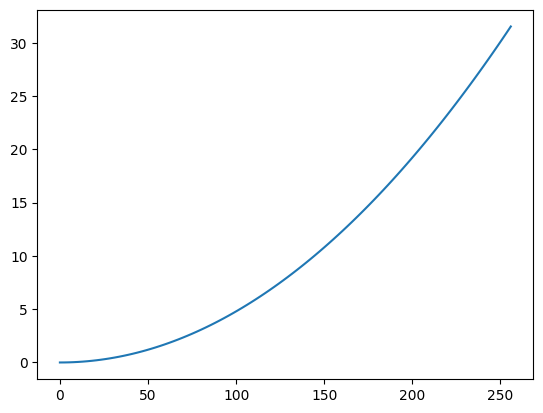

In [77]:
plt.plot(x0, z0)
plt.show()

In [78]:
q0=np.zeros(12*N)

In [79]:
for j in range(1,12):
    if j==1:
        q0[(j-1)*N:j*N]=x0
    elif j==5:
        q0[(j-1)*N:j*N]=z0

In [80]:
def static_func(Q): 
    t=0

    x,y,z=Q[0:N],Q[2*N:3*N],Q[4*N:5*N]
    dx,dy,dz=Q[1*N:2*N],Q[3*N:4*N],Q[5*N:6*N]
    φ,θ,ψ=Q[6*N:7*N],Q[8*N:9*N],Q[10*N:11*N]
    dφ,dθ,dψ=Q[7*N:8*N],Q[9*N:10*N],Q[11*N:12*N]
    
    RET = Ret(φ,θ,ψ)

    η = [x[-1],y[-1],z[-1],φ[-1],θ[-1],ψ[-1]]

    tau_force = np.array([-Fx_0,Fy_0,0,0,0,0])

    Z0 = tau_force[:3]    
    Z1 = d_s(ne, x, y, z, φ, θ, ψ).T
    Z2 = ne_hat(x, y, z, dx, dy, dz).T


    Z = (Z1 + Z2 - Z0)


############################################################
    ddx,ddy, ddz = (Z/Ws[0]).T
############################################################
    
    C0 = np.einsum('ijk,kp->ijp', Π(φ,θ,ψ), tau_force[3:].reshape(3,1))
    C1 = d_s(me, φ, θ, ψ, φ, θ, ψ)
    C = (C1.T - C0.squeeze())
 
    A0 = Jrho(RET,Jrho0)
    A_fin = np.einsum('ijk,ikr->ijr',A0, Π(φ,θ,ψ))

    B = np.einsum('ijk,ik->ij', Π(dφ,dθ,dψ), np.stack((dφ,dθ,dψ), axis=1))
    
    D = w_e(φ,θ,ψ,dφ,dθ,dψ)
    
    G = np.cross(d_s(phi,x,y,z,φ, θ, ψ).T, ne(x, y, z, φ, θ, ψ))
    L = np.einsum('ijk,ik->ij',RET, (DR@D.T).T) 
    
    H = np.cross(D,np.einsum('ijk,ik->ij', A0, D))

#############################################
    ddφ,ddθ,ddψ = np.linalg.solve(A_fin, C + G - L - H - np.einsum('ijk,ik->ij',A0, B)).T
#############################################

    ans=np.concatenate([dx, ddx, dy, ddy, dz, ddz, dφ, ddφ, dθ, ddθ, dψ, ddψ], axis=0)

    return ans

In [81]:
root_ = root(static_func, q0, method='df-sane')

In [82]:
root_

 message: too many function evaluations required
 success: False
     fun: [ 1.252e+01  1.252e+01 ...  0.000e+00  0.000e+00]
       x: [-5.023e+02 -4.997e+02 ...  0.000e+00  0.000e+00]
     nit: 309
    nfev: 1000
  method: df-sane

In [83]:
x0_, z0_=root_.x[:N],root_.x[4*N:5*N]

In [84]:
# q0 = root_.x                                            # start from static solution

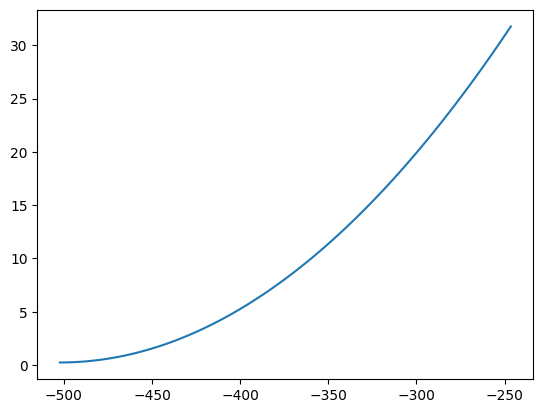

In [85]:
plt.plot(x0_, z0_)
plt.show()

### Finite Element Model of the Space Frame Element

In [86]:
def PlaneTrussElementLength(x1,y1,z1,x2,y2,z2):
    return np.sqrt((x2-x1)*(x2-x1) + (y2-y1)*(y2-y1)+(z2-z1)*(z2-z1))

In [87]:
def SpaceFrameElementStiffness(E,G,A,Iy,Iz,J,x1,y1,z1,x2,y2,z2):
    L = PlaneTrussElementLength(x1,y1,z1,x2,y2,z2)
    w1 = E*A/L
    w2 = 12*E*Iz/(L*L*L)
    w3 = 6*E*Iz/(L*L)
    w4 = 4*E*Iz/L
    w5 = 2*E*Iz/L
    w6 = 12*E*Iy/(L*L*L)
    w7 = 6*E*Iy/(L*L)
    w8 = 4*E*Iy/L
    w9 = 2*E*Iy/L
    w10 = G*J/L

    kprime = np.array([[w1, 0, 0, 0, 0, 0, -w1, 0, 0, 0, 0, 0],
                        [0, w2, 0, 0, 0, w3, 0, -w2, 0, 0, 0, w3],
                        [0, 0, w6, 0, -w7, 0, 0, 0, -w6, 0, -w7, 0],
                        [0, 0, 0, w10, 0, 0, 0, 0, 0, -w10, 0, 0],
                        [0, 0, -w7, 0, w8, 0, 0, 0, w7, 0, w9, 0],
                        [0, w3, 0, 0, 0, w4, 0, -w3, 0, 0, 0, w5],
                        [-w1, 0, 0, 0, 0, 0, w1, 0, 0, 0, 0, 0],
                        [0, -w2, 0, 0, 0, -w3, 0, w2, 0, 0, 0, -w3],
                        [0, 0, -w6, 0, w7, 0, 0, 0, w6, 0, w7, 0],
                        [0, 0, 0, -w10, 0, 0, 0, 0, 0, w10, 0, 0],
                        [0, 0, -w7, 0, w9, 0, 0, 0, w7, 0, w8, 0],
                        [0, w3, 0, 0, 0, w5, 0, -w3, 0, 0, 0, w4]])


    if x1 == x2 and y1 == y2:
        if z2 > z1:
            Lambda = np.array([[0, 0, 1], [0, 1, 0], [-1, 0, 0]])
        else:
            Lambda = np.array([[0, 0, -1], [0, 1, 0], [1, 0, 0]])
    else:
        CXx = (x2-x1)/L
        CYx = (y2-y1)/L
        CZx = (z2-z1)/L
        D = np.sqrt(CXx*CXx + CYx*CYx)
        CXy = -CYx/D
        CYy = CXx/D
        CZy = 0
        CXz = -CXx*CZx/D
        CYz = -CYx*CZx/D
        CZz = D
        Lambda = np.array([[CXx, CYx, CZx], [CXy, CYy, CZy], [CXz, CYz, CZz]])


    R = np.array([np.concatenate((np.concatenate((Lambda,np.zeros((3,3)),np.zeros((3,3)),np.zeros((3,3))),axis=1),
        np.concatenate((np.zeros((3,3)), Lambda, np.zeros((3,3)), np.zeros((3,3))),axis=1) ,
        np.concatenate((np.zeros((3,3)), np.zeros((3,3)), Lambda, np.zeros((3,3))),axis=1),
        np.concatenate((np.zeros((3,3)), np.zeros((3,3)), np.zeros((3,3)), Lambda),axis=1)))])[0]
    return np.dot(np.dot(R.T,kprime),R)

In [88]:
def SpaceFrameAssemble(K,k,i,j):
    K[6*i,6*i] = K[6*i,6*i] + k[0,0]
    K[6*i,6*i+1] = K[6*i,6*i+1] + k[0,1]
    K[6*i,6*i+2] = K[6*i,6*i+2] + k[0,2]
    K[6*i,6*i+3] = K[6*i,6*i+3] + k[0,3]
    K[6*i,6*i+4] = K[6*i,6*i+4] + k[0,4]
    K[6*i,6*i+5] = K[6*i,6*i+5] + k[0,5]
    K[6*i,6*j] = K[6*i,6*j] + k[0,6]
    K[6*i,6*j+1] = K[6*i,6*j+1] + k[0,7]
    K[6*i,6*j+2] = K[6*i,6*j+2] + k[0,8]
    K[6*i,6*j+3] = K[6*i,6*j+3] + k[0,9]
    K[6*i,6*j+4] = K[6*i,6*j+4] + k[0,10]
    K[6*i,6*j+5] = K[6*i,6*j+5] + k[0,11]
    K[6*i+1,6*i] = K[6*i+1,6*i] + k[1,0]
    K[6*i+1,6*i+1] = K[6*i+1,6*i+1] + k[1,1]
    K[6*i+1,6*i+2] = K[6*i+1,6*i+2] + k[1,2]
    K[6*i+1,6*i+3] = K[6*i+1,6*i+3] + k[1,3]
    K[6*i+1,6*i+4] = K[6*i+1,6*i+4] + k[1,4]
    K[6*i+1,6*i+5] = K[6*i+1,6*i+5] + k[1,5]
    K[6*i+1,6*j] = K[6*i+1,6*j] + k[1,6]
    K[6*i+1,6*j+1] = K[6*i+1,6*j+1] + k[1,7]
    K[6*i+1,6*j+2] = K[6*i+1,6*j+2] + k[1,8]
    K[6*i+1,6*j+3] = K[6*i+1,6*j+3] + k[1,9]
    K[6*i+1,6*j+4] = K[6*i+1,6*j+4] + k[1,10]
    K[6*i+1,6*j+5] = K[6*i+1,6*j+5] + k[1,11]
    K[6*i+2,6*i]   = K[6*i+2,6*i] + k[2,0]
    K[6*i+2,6*i+1] = K[6*i+2,6*i+1] + k[2,1]
    K[6*i+2,6*i+2] = K[6*i+2,6*i+2] + k[2,2]
    K[6*i+2,6*i+3] = K[6*i+2,6*i+3] + k[2,3]
    K[6*i+2,6*i+4] = K[6*i+2,6*i+4] + k[2,4]
    K[6*i+2,6*i+5] = K[6*i+2,6*i+5] + k[2,5]
    K[6*i+2,6*j]   = K[6*i+2,6*j] + k[2,6]
    K[6*i+2,6*j+1] = K[6*i+2,6*j+1] + k[2,7]
    K[6*i+2,6*j+2] = K[6*i+2,6*j+2] + k[2,8]
    K[6*i+2,6*j+3] = K[6*i+2,6*j+3] + k[2,9]
    K[6*i+2,6*j+4] = K[6*i+2,6*j+4] + k[2,10]
    K[6*i+2,6*j+5] = K[6*i+2,6*j+5] + k[2,11]
    K[6*i+3,6*i] = K[6*i+3,6*i] + k[3,0]
    K[6*i+3,6*i+1] = K[6*i+3,6*i+1] + k[3,1]
    K[6*i+3,6*i+2] = K[6*i+3,6*i+2] + k[3,2]
    K[6*i+3,6*i+3] = K[6*i+3,6*i+3] + k[3,3]
    K[6*i+3,6*i+4] = K[6*i+3,6*i+4] + k[3,4]
    K[6*i+3,6*i+5] = K[6*i+3,6*i+5] + k[3,5]
    K[6*i+3,6*j] = K[6*i+3,6*j] + k[3,6]
    K[6*i+3,6*j+1] = K[6*i+3,6*j+1] + k[3,7]
    K[6*i+3,6*j+2] = K[6*i+3,6*j+2] + k[3,8]
    K[6*i+3,6*j+3] = K[6*i+3,6*j+3] + k[3,9]
    K[6*i+3,6*j+4] = K[6*i+3,6*j+4] + k[3,10]
    K[6*i+3,6*j+5] = K[6*i+3,6*j+5] + k[3,11]
    K[6*i+4,6*i] = K[6*i+4,6*i] + k[4,0]
    K[6*i+4,6*i+1] = K[6*i+4,6*i+1] + k[4,1]
    K[6*i+4,6*i+2] = K[6*i+4,6*i+2] + k[4,2]
    K[6*i+4,6*i+3] = K[6*i+4,6*i+3] + k[4,3]
    K[6*i+4,6*i+4] = K[6*i+4,6*i+4] + k[4,4]
    K[6*i+4,6*i+5] = K[6*i+4,6*i+5] + k[4,5]
    K[6*i+4,6*j] = K[6*i+4,6*j] + k[4,6]
    K[6*i+4,6*j+1] = K[6*i+4,6*j+1] + k[4,7]
    K[6*i+4,6*j+2] = K[6*i+4,6*j+2] + k[4,8]
    K[6*i+4,6*j+3] = K[6*i+4,6*j+3] + k[4,9]
    K[6*i+4,6*j+4] = K[6*i+4,6*j+4] + k[4,10]
    K[6*i+4,6*j+5] = K[6*i+4,6*j+5] + k[4,11]
    K[6*i+5,6*i] = K[6*i+5,6*i] + k[5,0]
    K[6*i+5,6*i+1] = K[6*i+5,6*i+1] + k[5,1]
    K[6*i+5,6*i+2] = K[6*i+5,6*i+2] + k[5,2]
    K[6*i+5,6*i+3] = K[6*i+5,6*i+3] + k[5,3]
    K[6*i+5,6*i+4] = K[6*i+5,6*i+4] + k[5,4]
    K[6*i+5,6*i+5] = K[6*i+5,6*i+5] + k[5,5]
    K[6*i+5,6*j] = K[6*i+5,6*j] + k[5,6]
    K[6*i+5,6*j+1] = K[6*i+5,6*j+1] + k[5,7]
    K[6*i+5,6*j+2] = K[6*i+5,6*j+2] + k[5,8]
    K[6*i+5,6*j+3] = K[6*i+5,6*j+3] + k[5,9]
    K[6*i+5,6*j+4] = K[6*i+5,6*j+4] + k[5,10]
    K[6*i+5,6*j+5] = K[6*i+5,6*j+5] + k[5,11]
    K[6*j,6*i] = K[6*j,6*i] + k[6,0]
    K[6*j,6*i+1] = K[6*j,6*i+1] + k[6,1]
    K[6*j,6*i+2] = K[6*j,6*i+2] + k[6,2]
    K[6*j,6*i+3] = K[6*j,6*i+3] + k[6,3]
    K[6*j,6*i+4] = K[6*j,6*i+4] + k[6,4]
    K[6*j,6*i+5] = K[6*j,6*i+5] + k[6,5]
    K[6*j,6*j] = K[6*j,6*j] + k[6,6]
    K[6*j,6*j+1] = K[6*j,6*j+1] + k[6,7]
    K[6*j,6*j+2] = K[6*j,6*j+2] + k[6,8]
    K[6*j,6*j+3] = K[6*j,6*j+3] + k[6,9]
    K[6*j,6*j+4] = K[6*j,6*j+4] + k[6,10]
    K[6*j,6*j+5] = K[6*j,6*j+5] + k[6,11]
    K[6*j+1,6*i] = K[6*j+1,6*i] + k[7,0]
    K[6*j+1,6*i+1] = K[6*j+1,6*i+1] + k[7,1]
    K[6*j+1,6*i+2] = K[6*j+1,6*i+2] + k[7,2]
    K[6*j+1,6*i+3] = K[6*j+1,6*i+3] + k[7,3]
    K[6*j+1,6*i+4] = K[6*j+1,6*i+4] + k[7,4]
    K[6*j+1,6*i+5] = K[6*j+1,6*i+5] + k[7,5]
    K[6*j+1,6*j] = K[6*j+1,6*j] + k[7,6]
    K[6*j+1,6*j+1] = K[6*j+1,6*j+1] + k[7,7]
    K[6*j+1,6*j+2] = K[6*j+1,6*j+2] + k[7,8]
    K[6*j+1,6*j+3] = K[6*j+1,6*j+3] + k[7,9]
    K[6*j+1,6*j+4] = K[6*j+1,6*j+4] + k[7,10]
    K[6*j+1,6*j+5] = K[6*j+1,6*j+5] + k[7,11]
    K[6*j+2,6*i] = K[6*j+2,6*i] + k[8,0]
    K[6*j+2,6*i+1] = K[6*j+2,6*i+1] + k[8,1]
    K[6*j+2,6*i+2] = K[6*j+2,6*i+2] + k[8,2]
    K[6*j+2,6*i+3] = K[6*j+2,6*i+3] + k[8,3]
    K[6*j+2,6*i+4] = K[6*j+2,6*i+4] + k[8,4]
    K[6*j+2,6*i+5] = K[6*j+2,6*i+5] + k[8,5]
    K[6*j+2,6*j] = K[6*j+2,6*j] + k[8,6]
    K[6*j+2,6*j+1] = K[6*j+2,6*j+1] + k[8,7]
    K[6*j+2,6*j+2] = K[6*j+2,6*j+2] + k[8,8]
    K[6*j+2,6*j+3] = K[6*j+2,6*j+3] + k[8,9]
    K[6*j+2,6*j+4] = K[6*j+2,6*j+4] + k[8,10]
    K[6*j+2,6*j+5] = K[6*j+2,6*j+5] + k[8,11]
    K[6*j+3,6*i] = K[6*j+3,6*i] + k[9,0]
    K[6*j+3,6*i+1] = K[6*j+3,6*i+1] + k[9,1]
    K[6*j+3,6*i+2] = K[6*j+3,6*i+2] + k[9,2]
    K[6*j+3,6*i+3] = K[6*j+3,6*i+3] + k[9,3]
    K[6*j+3,6*i+4] = K[6*j+3,6*i+4] + k[9,4]
    K[6*j+3,6*i+5] = K[6*j+3,6*i+5] + k[9,5]
    K[6*j+3,6*j] = K[6*j+3,6*j] + k[9,6]
    K[6*j+3,6*j+1] = K[6*j+3,6*j+1] + k[9,7]
    K[6*j+3,6*j+2] = K[6*j+3,6*j+2] + k[9,8]
    K[6*j+3,6*j+3] = K[6*j+3,6*j+3] + k[9,9]
    K[6*j+3,6*j+4] = K[6*j+3,6*j+4] + k[9,10]
    K[6*j+3,6*j+5] = K[6*j+3,6*j+5] + k[9,11]
    K[6*j+4,6*i] = K[6*j+4,6*i] + k[10,0]
    K[6*j+4,6*i+1] = K[6*j+4,6*i+1] + k[10,1]
    K[6*j+4,6*i+2] = K[6*j+4,6*i+2] + k[10,2]
    K[6*j+4,6*i+3] = K[6*j+4,6*i+3] + k[10,3]
    K[6*j+4,6*i+4] = K[6*j+4,6*i+4] + k[10,4]
    K[6*j+4,6*i+5] = K[6*j+4,6*i+5] + k[10,5]
    K[6*j+4,6*j] = K[6*j+4,6*j] + k[10,6]
    K[6*j+4,6*j+1] = K[6*j+4,6*j+1] + k[10,7]
    K[6*j+4,6*j+2] = K[6*j+4,6*j+2] + k[10,8]
    K[6*j+4,6*j+3] = K[6*j+4,6*j+3] + k[10,9]
    K[6*j+4,6*j+4] = K[6*j+4,6*j+4] + k[10,10]
    K[6*j+4,6*j+5] = K[6*j+4,6*j+5] + k[10,11]
    K[6*j+5,6*i] = K[6*j+5,6*i] + k[11,0]
    K[6*j+5,6*i+1] = K[6*j+5,6*i+1] + k[11,1]
    K[6*j+5,6*i+2] = K[6*j+5,6*i+2] + k[11,2]
    K[6*j+5,6*i+3] = K[6*j+5,6*i+3] + k[11,3]
    K[6*j+5,6*i+4] = K[6*j+5,6*i+4] + k[11,4]
    K[6*j+5,6*i+5] = K[6*j+5,6*i+5] + k[11,5]
    K[6*j+5,6*j] = K[6*j+5,6*j] + k[11,6]
    K[6*j+5,6*j+1] = K[6*j+5,6*j+1] + k[11,7]
    K[6*j+5,6*j+2] = K[6*j+5,6*j+2] + k[11,8]
    K[6*j+5,6*j+3] = K[6*j+5,6*j+3] + k[11,9]
    K[6*j+5,6*j+4] = K[6*j+5,6*j+4] + k[11,10]
    K[6*j+5,6*j+5] = K[6*j+5,6*j+5] + k[11,11]

    return K

In [89]:
def FEA(coord, elcon, bc_node, bc_val, vessel_movement, coefs,
          E=210e6, G=84e6, A=2e-2, Iy=10e-5, Iz=20e-5, J=5e-5):

    coord=np.array(coord)
    elcon=np.array(elcon)

    K=np.zeros(shape=(6*(np.max(elcon)+1),6*(np.max(elcon)+1)))

    for el in elcon:
        k=SpaceFrameElementStiffness(E,G,A,Iy,Iz,J,
                                     coord[el[0]][0],coord[el[0]][1],coord[el[0]][2],\
                                     coord[el[1]][0],coord[el[1]][1],coord[el[1]][2])
        K=SpaceFrameAssemble(K,k,el[0],el[1])
        
        
    glob_force=np.dot(K, np.array(vessel_movement))
    
    glob_force[-6:]=np.multiply(glob_force[-6:], coefs)
    glob_force = np.zeros(len(vessel_movement))


    F=np.zeros(len(coord)*6)
    for i in range(len(vessel_movement)):
        if vessel_movement[i]:
            F[i]=glob_force[i]

    # https://github.com/CALFEM/calfem-matlab/blob/master/fem/solveq.m

    bc=np.array([bc_node,
                bc_val]).T
    nd, nd=K.shape
    fdof=np.array([i for i in range(nd)]).T
    d=np.zeros(shape=(len(fdof),))
    Q=np.zeros(shape=(len(fdof),))

    pdof=bc[:,0].astype(int)
    dp=bc[:,1]
    fdof=np.delete(fdof, pdof, 0)
    s=scipy.linalg.lstsq(K[fdof,:][:,fdof], (F[fdof].T-np.dot(K[fdof,:][:,pdof],dp.T)).T, check_finite=True)[0]
    d[pdof]=dp
    d[fdof]=s.reshape(-1,)
    

#     Q=np.dot(K,d).T-F
    return d, np.dot(K,d).T

In [90]:
# 10 The Space Frame Element - verification
d,f=FEA(np.array([0,0,0,
                  3,0,0,
                  0,0,-3,
                  0,-4,0]).reshape(4,3),
        elcon=np.array([[0, 1],
                      [0, 2],
                      [0, 3]]),
        bc_node=list(range(6)),
        bc_val=[ -0.0705e-4, -0.0007e-4, 0.1418e-4, 0.0145e-4, 0.0175e-4,0.0114e-4],
        vessel_movement=[ 0, 0, 0, 0, 0,0.0,
                                0,0,0,0,0,0,
                                0,0,0,0,0,0,
                                0,0,0,0,0,0,
                       ],
        coefs=[1,1,1,1,1,1])

In [91]:
d

array([-7.050e-06, -7.000e-08,  1.418e-05,  1.450e-06,  1.750e-06,
        1.140e-06, -7.050e-06,  3.350e-06,  8.930e-06,  1.450e-06,
        1.750e-06,  1.140e-06, -1.230e-05,  4.280e-06,  1.418e-05,
        1.450e-06,  1.750e-06,  1.140e-06, -2.490e-06, -7.000e-08,
        8.380e-06,  1.450e-06,  1.750e-06,  1.140e-06])

In [92]:
f

array([ 2.18575158e-15, -1.86923231e-17, -3.84067778e-15,  9.71445147e-17,
        4.94078553e-17, -1.38777878e-17, -5.59719372e-16, -2.94360890e-17,
        2.29749217e-17,  3.06625927e-19,  2.51331616e-17,  5.88721780e-17,
        1.93123512e-17,  1.42708111e-17,  1.72398987e-15, -2.85416222e-17,
        6.63802780e-17, -6.09863722e-20,  2.08166817e-17,  4.64478987e-17,
        2.42861287e-17,  1.38777878e-17,  3.17637355e-20, -1.38777878e-17])

In [93]:
def PipeForce(X,Y,Z,vessel_movement,coefs, E=E, G=G, A=Ar, Iy=Iy_, Iz=Iz_, J=J_):
    coord=np.stack((X,Y,Z)).T
    elcon=[]
    for i in range(1,len(X)):
        elcon.append([i-1,i])
    
    bc_node = list(range(3))+list(range((6*len(X)-6),6*len(X)))
    bc_val = [0]*3 + vessel_movement
    
    vessel_move=np.zeros(len(X)*6)

    d, f = FEA(coord,elcon,bc_node,bc_val,vessel_move, coefs, E,G,A,Iy,Iz,J)

    fors=[]
    for i in range(0,len(f),6):
        fors.append(f[i:i+3])

    mom =[]
    for i in range(3,len(f),6):
        mom.append(f[i:i+3])

    angle=[]
    for i in range(3,len(d),6):
        angle.append(d[i:i+3])
    fors[0][0]=0
    fors[0][1]=0
    fors[0][2]=0
    return np.array(fors), np.array(mom), np.array(angle)

In [94]:
fors, mom, angle = PipeForce(x0_,list([0 for i in range(len(z0))]),z0_,
[0.01,
 0.02,
 0.03,
 0.01,
 -0.05,
 0.03],
 [1,1,1,1,1,1]
)

In [95]:
fors

array([[ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [-2.09245682e-02, -5.85937500e-03, -1.33300781e-01],
       [-1.31807327e-01, -5.37109375e-03, -1.27929688e-01],
       [-1.17053986e-02,  8.27026367e-03,  1.12548828e-01],
       [-5.29918671e-02,  2.53906250e-02, -1.65222168e-01],
       [-1.38381958e-01,  4.29687500e-02,  5.32226562e-02],
       [-1.02066040e-01, -3.90625000e-03, -5.46875000e-02],
       [ 1.14700317e-01, -3.37219238e-02, -8.64257812e-02],
       [-1.25771523e-01, -4.29687500e-02,  2.23327637e-01],
       [-3.26843262e-02, -7.81250000e-03,  2.92968750e-02],
       [ 2.09960938e-02,  3.12500000e-02, -1.01562500e-01],
       [ 2.50854492e-02,  6.64062500e-02,  2.53906250e-02],
       [ 1.35719299e-01,  7.42187500e-02,  2.19116211e-02],
       [-1.12365723e-01,  3.12500000e-02, -1.17187500e-02],
       [ 3.66210938e-03, -1.56250000e-02,  4.29687500e-02],
       [ 9.23461914e-02,  2.19726562e-02, -1.54296875e-01],
       [ 2.41641998e-02, -3.90625000e-03

In [96]:
mom

array([[ 1.50936127e-01, -2.24919930e-01, -9.27734375e-03],
       [ 5.88970184e-02,  2.66357422e-01, -1.37405396e-02],
       [-1.06399536e-01, -1.11694336e-02,  5.37109375e-03],
       [-5.98564148e-02,  3.75976562e-02,  7.32421875e-03],
       [-6.91833496e-02,  7.94067383e-02,  1.56250000e-02],
       [-1.87736511e-01, -2.33398438e-01, -7.56835938e-03],
       [-5.02014160e-02,  3.16101074e-01, -3.12500000e-02],
       [ 1.44042969e-01, -1.66015625e-02, -6.83593750e-03],
       [-6.77490234e-03, -9.77172852e-02, -3.90625000e-03],
       [-3.39813232e-02,  2.73437500e-02,  3.02429199e-02],
       [ 2.09716797e-01, -9.68017578e-02, -1.56250000e-02],
       [ 6.95037842e-02,  1.95312500e-03,  1.95312500e-03],
       [-3.99169922e-02,  8.75549316e-02,  7.81250000e-03],
       [-1.02996826e-02, -7.03125000e-02,  3.17382812e-03],
       [-6.59179688e-03,  2.20336914e-02,  3.51562500e-02],
       [ 2.22473145e-02,  1.28906250e-01,  4.24804688e-02],
       [ 8.20312500e-02,  6.61315918e-02

In [97]:
angle

array([[-0.37620113,  0.02452603, -0.04147327],
       [-0.37620113,  0.0245188 , -0.04147327],
       [-0.37619872,  0.02449709, -0.04147325],
       [-0.3761915 ,  0.0244609 , -0.04147319],
       [-0.37617704,  0.02441021, -0.04147305],
       [-0.37615294,  0.02434499, -0.04147276],
       [-0.37611679,  0.02426524, -0.04147224],
       [-0.37606619,  0.02417093, -0.0414714 ],
       [-0.37599872,  0.02406204, -0.04147011],
       [-0.37591198,  0.02393857, -0.04146824],
       [-0.37580355,  0.02380049, -0.04146564],
       [-0.37567104,  0.02364778, -0.04146214],
       [-0.37551203,  0.02348042, -0.04145756],
       [-0.37532411,  0.0232984 , -0.04145167],
       [-0.37510488,  0.02310169, -0.04144427],
       [-0.37485194,  0.02289028, -0.04143512],
       [-0.37456288,  0.02266415, -0.04142394],
       [-0.37423529,  0.02242327, -0.04141046],
       [-0.37386677,  0.02216763, -0.04139439],
       [-0.37345492,  0.0218972 , -0.04137542],
       [-0.37299734,  0.02161197, -0.041

### Vessle Simulation

In [98]:
sampleTime = 0.01              # sample time [seconds]
Number = 60000                      # number of samples

In [99]:
Number*sampleTime

600.0

In [100]:
vehicle=semisub('DPcontrol',1,-1,0.0,0,0)

In [101]:
[simTime, simData] = simulate(Number, sampleTime, vehicle)

In [102]:
ans_t=[]
sum_=0
for i in range(simData.shape[0]):
    ans_t.append(sum_)
    sum_+=sampleTime

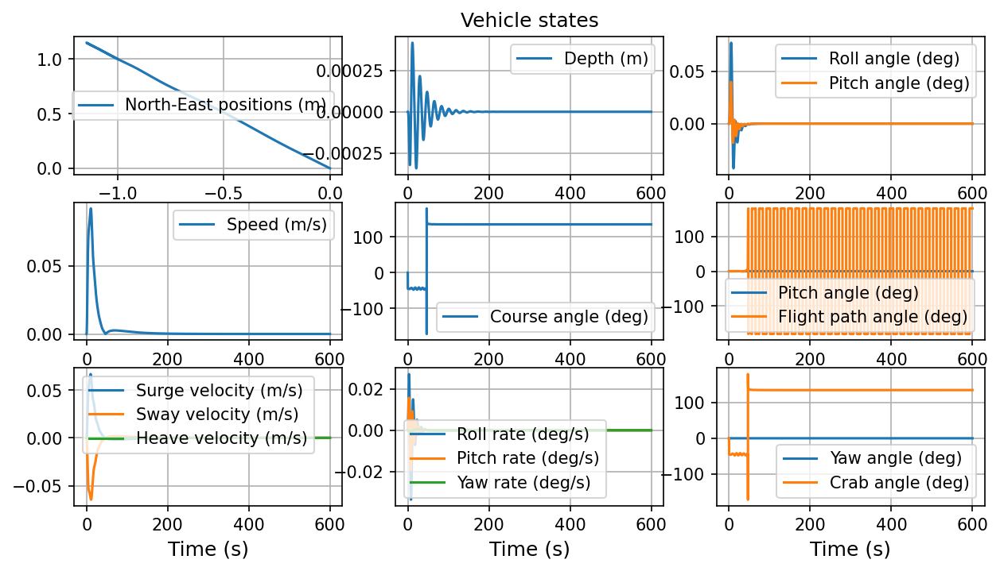

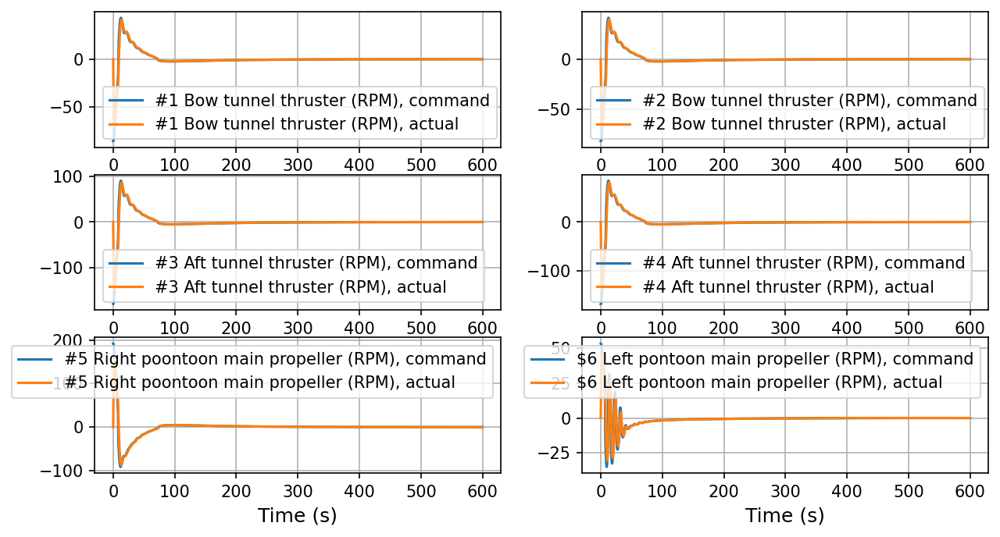

In [103]:
plotVehicleStates(simTime, simData, 1)
plotControls(simTime, simData, vehicle, 2)

In [104]:
numDataPoints = 5                 # number of 3D data points
FPS = 10                            # frames per second (animated GIF)
filename = '3D_animation.gif'       # data file for animated GIF
browser = 'safari'

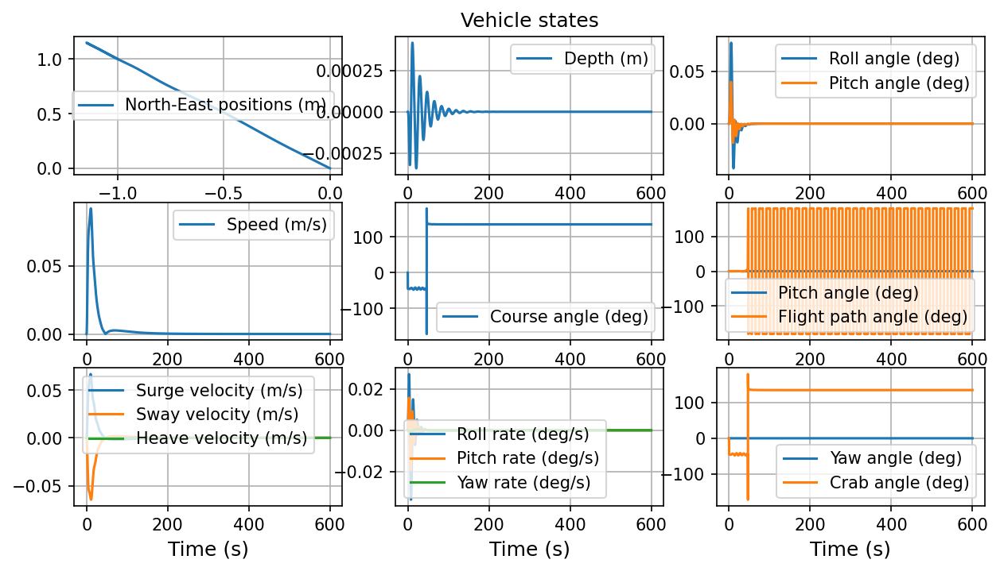

In [105]:
plotVehicleStates(simTime, simData, 3)

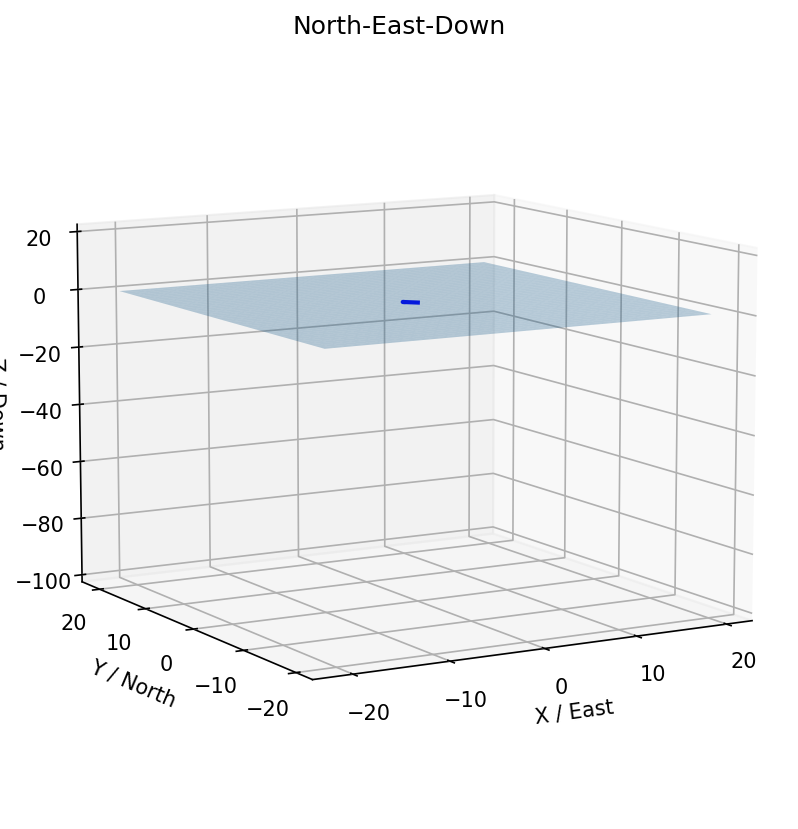

In [106]:
plot3D(simData, numDataPoints, FPS, filename, 3)

In [107]:
def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return idx

In [108]:
class MyTime:
    def __init__(self):
        self.my_t = 0
        self.v_m = np.array([0,0,0,0,0,0]).astype(np.float64)
        self.progression = [i for i in range(650)]
        self.wall_clock = datetime.now()
        self.x_ve = 0
        self.y_ve = 0
        self.z_ve = 0
        self.phi_ve = 0
        self.theta_ve = 0
        self.psi_ve = 0
        self.max_bending_strain = 0
        self.max_bending_strain1 = 0
        self.my_iter = 0

In [109]:
def inert(M, m, X):
    sum_=M
    ans=[]
    for i in range(len(X)-1,-1,-1):
        sum_+=m
        ans.append(np.array(sum_).copy())
    return np.array(ans)  

In [110]:
# V_rho=np.zeros(Jrho0.shape)
# np.fill_diagonal(V_rho, vessel_inertia)

In [111]:
# M_t=inert(vessel_mass*9.81,mp*9.81, x0)
# Jrho1=inert(V_rho, Jrho0, x0)

### Dynamics

In [112]:
def dynamic_func(t, Q, coefs, T, calibr):
    
    x,y,z=Q[0:N],Q[2*N:3*N],Q[4*N:5*N]
    dx,dy,dz=Q[1*N:2*N],Q[3*N:4*N],Q[5*N:6*N]
    φ,θ,ψ=Q[6*N:7*N],Q[8*N:9*N],Q[10*N:11*N]
    dφ,dθ,dψ=Q[7*N:8*N],Q[9*N:10*N],Q[11*N:12*N]
    
    idx = find_nearest(np.array(ans_t),  t)
    
    del_t = idx-T.my_t
    if del_t<0:
        idx=T.my_t
        
    x_ve = simData[:, 0][idx]
    y_ve = simData[:, 1][idx]
    z_ve = simData[:, 2][idx]
    phi_ve = ssa(simData[:, 3][idx])
    theta_ve = ssa(simData[:, 4][idx])
    psi_ve = ssa(simData[:, 5][idx])
    
    RET = Ret(φ,θ,ψ)

    vessel_movement = np.zeros(6)
    
    
    vessel_movement[0] = (x_ve - T.x_ve)
    vessel_movement[1] = (y_ve - T.y_ve)
    vessel_movement[2] = (z_ve - T.z_ve)
    vessel_movement[3] = (phi_ve - T.phi_ve)
    vessel_movement[4] = (theta_ve - T.theta_ve)
    vessel_movement[5] = (psi_ve - T.psi_ve)

    vessel_movement/=calibr
    

    fors, mom, angle = PipeForce(x, y, z, list(vessel_movement), coefs)
    
    Z0 = fors.squeeze()
    Z1 = d_s(ne, x, y, z, φ, θ, ψ).T
    Z2 = ne_hat(x, y, z, dx, dy, dz).T

    Z = (Z1 + Z2 - Z0)

############################################################
#     ddx,ddy, ddz = (Z/(M_t.reshape(-1, 1))).T
    ddx,ddy, ddz = (Z/Ws[0]).T    
############################################################
    
    C0 = np.einsum('ijk,ik->ij', Π(φ,θ,ψ), angle).squeeze()    
    C1 = d_s(me, φ, θ, ψ, φ, θ, ψ)
    C = (C1.T - C0)


    A0 = Jrho(RET,Jrho0)
#     A0 = Jrho(RET,Jrho1) 
    A_fin = np.einsum('ijk,ikr->ijr', A0, Π(φ,θ,ψ))
    

    B = np.einsum('ijk,ik->ij', Π(dφ,dθ,dψ), np.stack((dφ,dθ,dψ), axis=1))
    
    D = w_e(φ,θ,ψ,dφ,dθ,dψ)
    
    G = np.cross(d_s(phi,x,y,z,φ, θ, ψ).T, ne(x, y, z, φ, θ, ψ))
    
    L = np.einsum('ijk,ik->ij',RET, (DR@D.T).T) 

    H = np.cross(D, np.einsum('ijk,ik->ij', A0, D))
    

#############################################
    ddφ,ddθ,ddψ = np.linalg.solve(A_fin, (C + G - L - H - np.einsum('ijk,ik->ij', A0, B))).T
#############################################

    T.my_t=idx
    T.x_ve=x_ve
    T.y_ve=y_ve
    T.z_ve=z_ve
    T.phi_ve = phi_ve
    T.theta_ve = theta_ve
    T.psi_ve = psi_ve

    if t>T.progression[0]:
        T.progression.pop(0)
        print('Physical time: ', t, ' Iteration wall clock time: ', datetime.now() - T.wall_clock )
        T.wall_clock = datetime.now()   
        
        
    nz = np.linalg.norm(ddz)
    ddz = ddz / nz  
    
    ans=np.concatenate([dx, ddx, 
                        dy, ddy, 
                        dz, ddz, 
                        dφ, ddφ, 
                        dθ, ddθ, 
                        dψ, ddψ
                       ], axis=0)
   
   
    ax=np.max(np.einsum('ijk,ik->ij',np.linalg.inv(RET),ne(x, y, z, φ, θ, ψ)))/(mp*9.81*h)
    W = 3.14*(d0**4-dI**4)/(32*d0)
    T.max_bending_strain=max(T.max_bending_strain,(ax*12/W)/E)
    
    ben=np.max(np.einsum('ijk,ik->ij',np.linalg.inv(RET), me(φ, θ, ψ, φ, θ, ψ)))/(mp*9.81*1**2)
    T.max_bending_strain1=max(T.max_bending_strain1,(ben/W)/E)
    
    T.my_iter+=1
    
    return ans

In [113]:
T_ = MyTime()

# initial conditions
q0[6*N:7*N], q0[8*N:9*N], q0[10*N:11*N] = (np.array([0.01 for i in range(N)]),
                                          np.array([0.000001 for i in range(N)]),
                                          np.array([0.001257*i/N for i in range(N)]))

In [114]:
startTime1 = datetime.now()
us_=solve_ivp(dynamic_func,
             tspan,
             q0,
             args=(coefs, T_, vessel_motion_calibration_coefficient,))
print(datetime.now() - startTime1)

Physical time:  7.55864082187574e-07  Iteration wall clock time:  0:00:00.984633
Physical time:  1.0072757590710946  Iteration wall clock time:  0:00:45.378836
Physical time:  2.0350499453256434  Iteration wall clock time:  0:00:38.899138
Physical time:  3.000388022496161  Iteration wall clock time:  0:00:38.147013
Physical time:  4.012687947887401  Iteration wall clock time:  0:00:44.999543
Physical time:  5.000446947233006  Iteration wall clock time:  0:00:38.951118
Physical time:  6.000240663587537  Iteration wall clock time:  0:00:37.717725
Physical time:  7.040754411401843  Iteration wall clock time:  0:00:42.634065
Physical time:  8.000763413198436  Iteration wall clock time:  0:00:41.399962
Physical time:  9.007591628762084  Iteration wall clock time:  0:00:50.083266
Physical time:  10.007280917784087  Iteration wall clock time:  0:00:35.882592
Physical time:  11.053401666574052  Iteration wall clock time:  0:00:43.915656
Physical time:  12.002865916799935  Iteration wall clock 

In [115]:
# max bending strain
T_.max_bending_strain*mp*9.81*h

0.04510817752825455

In [116]:
T_.max_bending_strain1*mp*9.81*1**2

1.2305349583829681

In [117]:
# axial tension
W = 3.14*(d0**4-dI**4)/(32*d0)
T_.max_bending_strain*mp*9.81*h*W*E/12

3054785.909759342

### Results

In [118]:
fin=us_

In [119]:
fin

  message: The solver successfully reached the end of the integration interval.
  success: True
   status: 0
        t: [ 0.000e+00  7.559e-05 ...  4.992e+01  5.000e+01]
        y: [[ 0.000e+00  3.642e-25 ...  4.790e-04  4.806e-04]
            [ 2.584e+00  2.584e+00 ...  2.248e+00  2.247e+00]
            ...
            [ 0.000e+00 -4.263e-18 ... -1.114e-13 -1.059e-13]
            [ 0.000e+00  1.363e-18 ... -8.139e-14 -7.595e-14]]
      sol: None
 t_events: None
 y_events: None
     nfev: 3422
     njev: 0
      nlu: 0

In [120]:
t=fin.t

In [121]:
fin=fin.y.T

In [122]:
t.shape, fin.shape

((510,), (510, 1200))

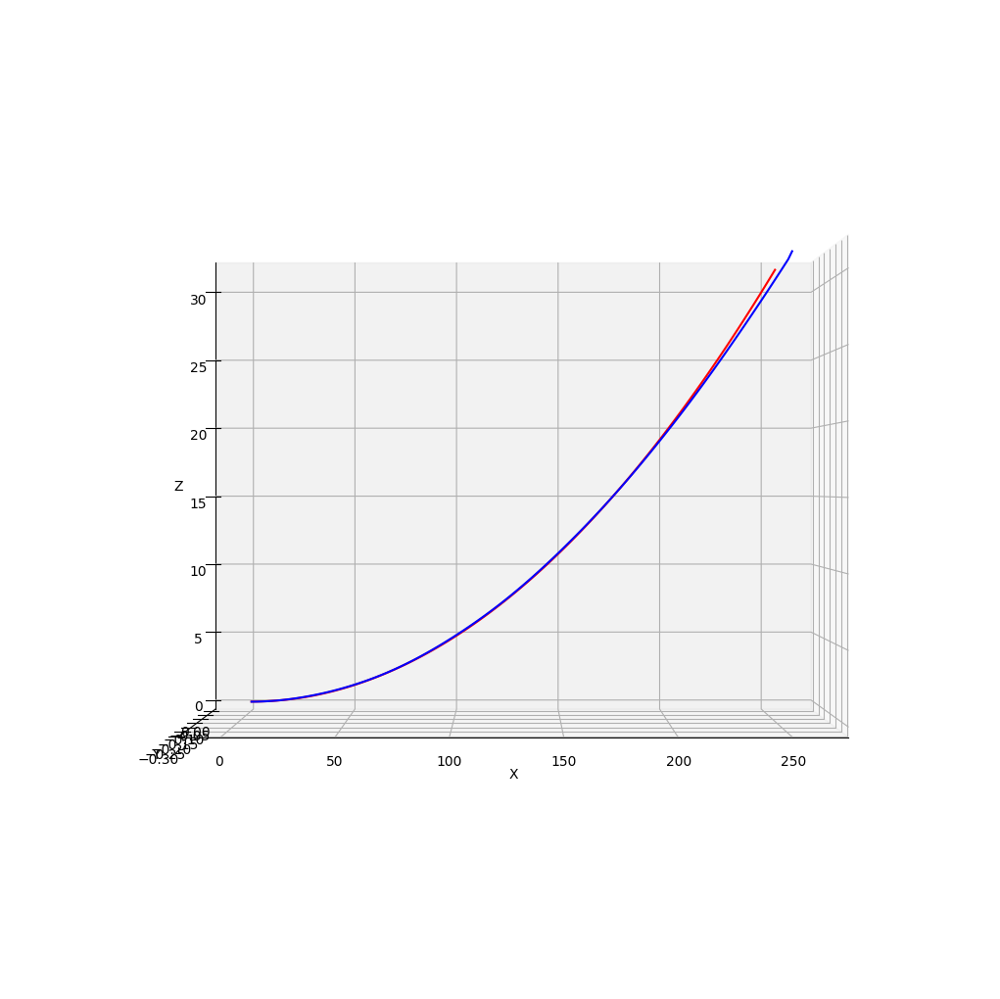

In [123]:
fig=plt.figure(figsize=(13,13))
ax = fig.add_subplot(projection = '3d')

X0=fin[0,[i for i in range(0,N)]]
Y0=fin[0,[i for i in range(2*N,3*N)]]
Z0=fin[0,[i for i in range(4*N,5*N)]]

j=-1
X=fin[j,[i for i in range(0,N)]]
Y=fin[j,[i for i in range(2*N,3*N)]]
Z=fin[j,[i for i in range(4*N,5*N)]]

num_true_pts = 200
tck, u = interpolate.splprep([X,Y,Z], s=2)
u_fine = np.linspace(0,1,num_true_pts)
x_fine, y_fine, z_fine = interpolate.splev(u_fine, tck)

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.plot(X0,Y0,Z0, color='r')
ax.plot(X,Y,Z, color='b')
# ax.plot(x_fine, y_fine, z_fine, color='b')
# ax.view_init(-45,-45)
# ax.view_init(-30,-30)
ax.view_init(0,-90)
plt.show()

In [124]:
X,Y,Z

(array([4.80577230e-04, 2.24704654e+00, 4.65098110e+00, 7.09654764e+00,
        9.56234255e+00, 1.20400496e+01, 1.45262813e+01, 1.70205489e+01,
        1.95244323e+01, 2.20399808e+01, 2.45691577e+01, 2.71141126e+01,
        2.96772869e+01, 3.22556679e+01, 3.48404505e+01, 3.74251908e+01,
        4.00069050e+01, 4.25851414e+01, 4.51603499e+01, 4.77331253e+01,
        5.03037485e+01, 5.28729756e+01, 5.54412389e+01, 5.80087819e+01,
        6.05747426e+01, 6.31390672e+01, 6.57028379e+01, 6.82665557e+01,
        7.08297997e+01, 7.33930226e+01, 7.59553420e+01, 7.85151166e+01,
        8.10720518e+01, 8.36289384e+01, 8.61888928e+01, 8.87496372e+01,
        9.13094211e+01, 9.38672365e+01, 9.64225295e+01, 9.89770510e+01,
        1.01531757e+02, 1.04087184e+02, 1.06642001e+02, 1.09194357e+02,
        1.11746067e+02, 1.14302048e+02, 1.16861773e+02, 1.19422413e+02,
        1.21980699e+02, 1.24535246e+02, 1.27087690e+02, 1.29639057e+02,
        1.32191801e+02, 1.34745404e+02, 1.37296988e+02, 1.398455

In [125]:
X0,Y0,Z0

(array([  0.        ,   2.58433427,   5.16866853,   7.7530028 ,
         10.33733706,  12.92167133,  15.5060056 ,  18.09033986,
         20.67467413,  23.2590084 ,  25.84334266,  28.42767693,
         31.01201119,  33.59634546,  36.18067973,  38.76501399,
         41.34934826,  43.93368252,  46.51801679,  49.10235106,
         51.68668532,  54.27101959,  56.85535386,  59.43968812,
         62.02402239,  64.60835665,  67.19269092,  69.77702519,
         72.36135945,  74.94569372,  77.53002798,  80.11436225,
         82.69869652,  85.28303078,  87.86736505,  90.45169932,
         93.03603358,  95.62036785,  98.20470211, 100.78903638,
        103.37337065, 105.95770491, 108.54203918, 111.12637344,
        113.71070771, 116.29504198, 118.87937624, 121.46371051,
        124.04804478, 126.63237904, 129.21671331, 131.80104757,
        134.38538184, 136.96971611, 139.55405037, 142.13838464,
        144.7227189 , 147.30705317, 149.89138744, 152.4757217 ,
        155.06005597, 157.64439023, 160.

In [126]:
us=fin.T

In [127]:
us.shape

(1200, 510)

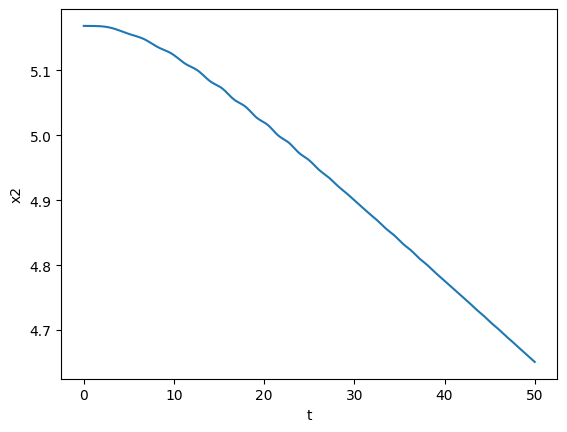

In [128]:
plt.plot(t,us.T[:,2],'-')
plt.xlabel('t')
plt.ylabel('x2')
plt.show()

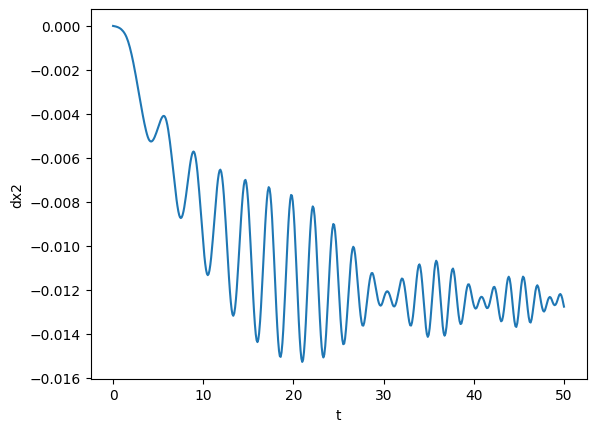

In [129]:
plt.plot(t,us.T[:,N+2] ,'-')
plt.xlabel('t')
plt.ylabel('dx2')
plt.show()

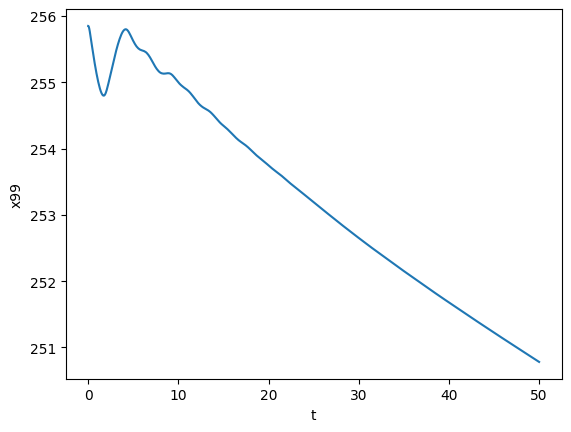

In [130]:
plt.plot(t,us.T[:,N-1] ,'-')
plt.xlabel('t')
plt.ylabel('x{}'.format(N-1))
plt.show()

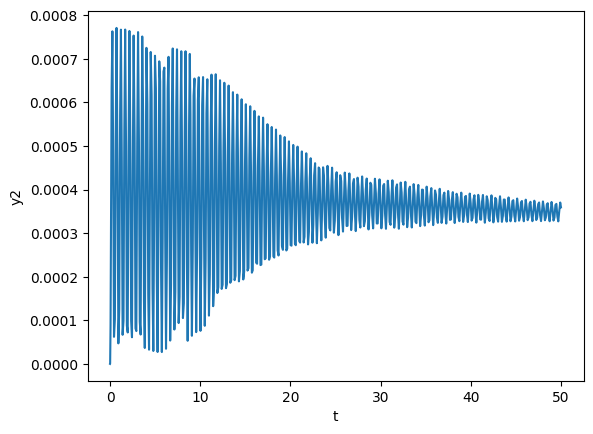

In [131]:
plt.plot(t,us.T[:,2*N +2] ,'-')
plt.xlabel('t')
plt.ylabel('y2')
plt.show()

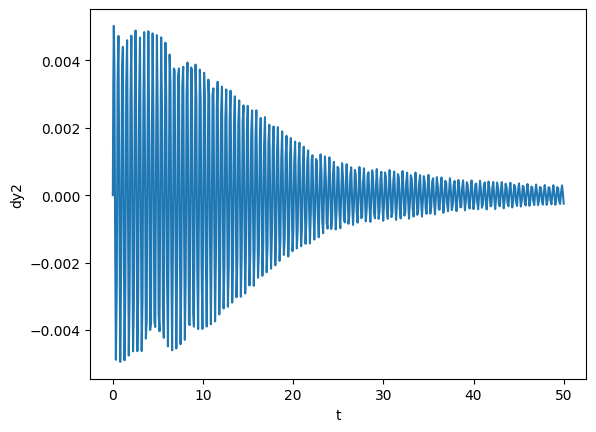

In [132]:
plt.plot(t,us.T[:,3*N+2] ,'-')
plt.xlabel('t')
plt.ylabel('dy2')
plt.show()

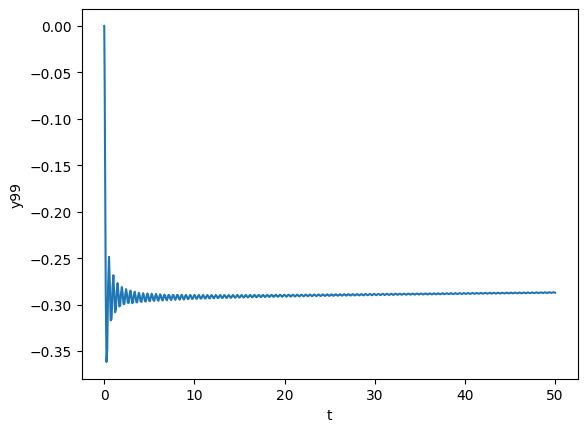

In [133]:
plt.plot(t,us.T[:,2*N+(N-1)] ,'-')
plt.xlabel('t')
plt.ylabel('y{}'.format(N-1))
plt.show()

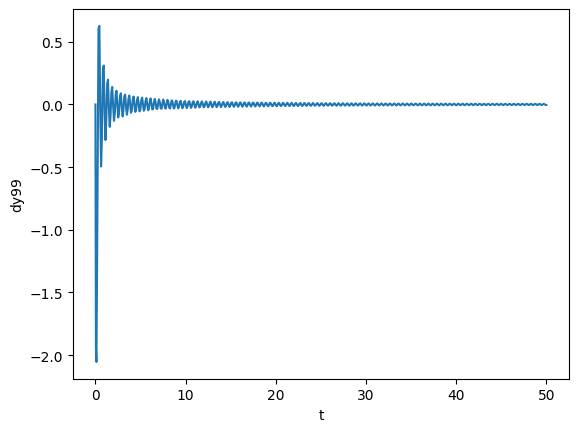

In [134]:
plt.plot(t,us.T[:,3*N+(N-1)] ,'-')
plt.xlabel('t')
plt.ylabel('dy{}'.format(N-1))
plt.show()

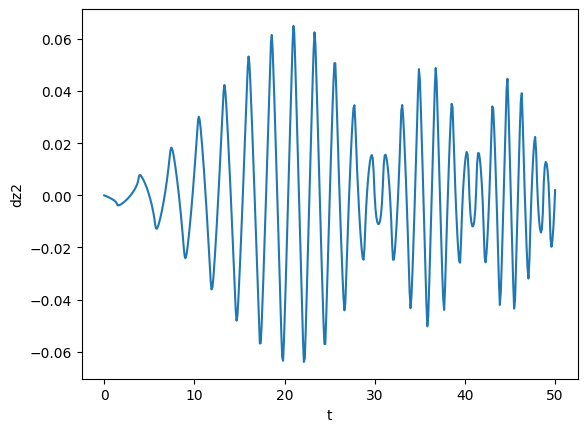

In [135]:
plt.plot(t,us.T[:,5*N+2] ,'-')
plt.xlabel('t')
plt.ylabel('dz2')
plt.show()

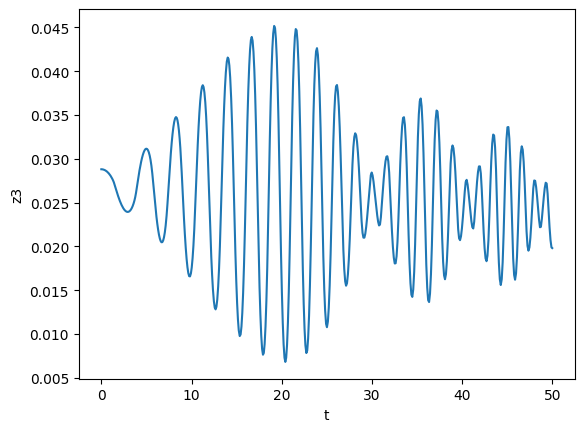

In [136]:
plt.plot(t,us.T[:,4*N+3] ,'-')
plt.xlabel('t')
plt.ylabel('z3')
plt.show()

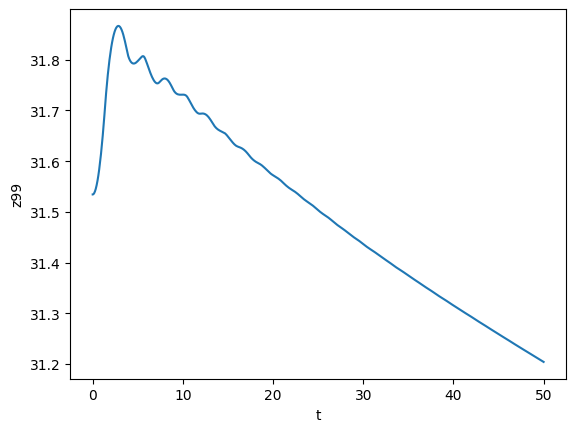

In [137]:
plt.plot(t,us.T[:,4*N + (N-1)] ,'-')
plt.xlabel('t')
plt.ylabel('z{}'.format(N-1))
plt.show()

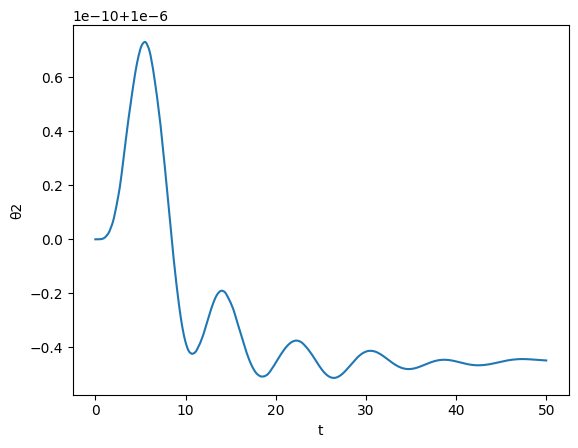

In [138]:
plt.plot(t,us.T[:,8*N+2],'-')
plt.xlabel('t')
plt.ylabel('θ2')
plt.show()

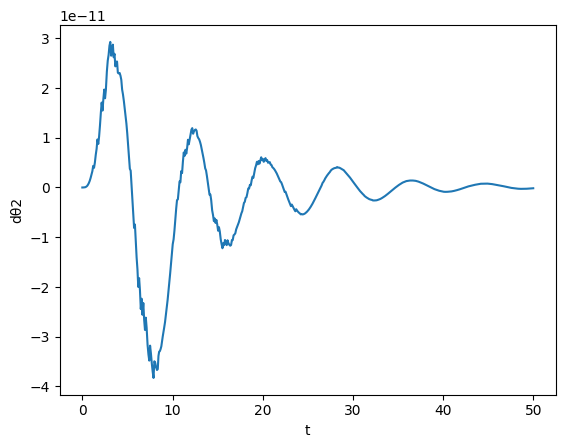

In [139]:
plt.plot(t,us.T[:,9*N+2] ,'-')
plt.xlabel('t')
plt.ylabel('dθ2')
plt.show()

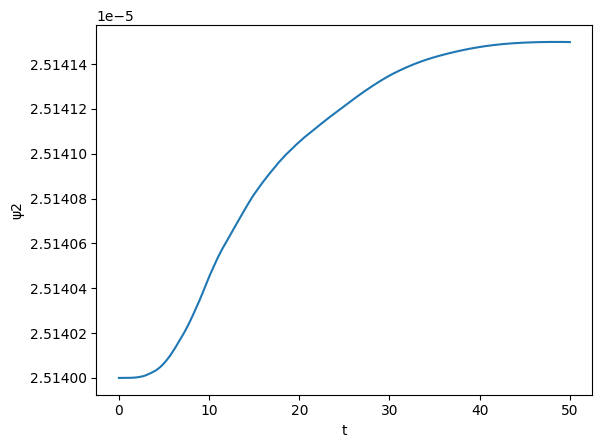

In [140]:
plt.plot(t,us.T[:,10*N+2],'-')
plt.xlabel('t')
plt.ylabel('ψ2')
plt.show()

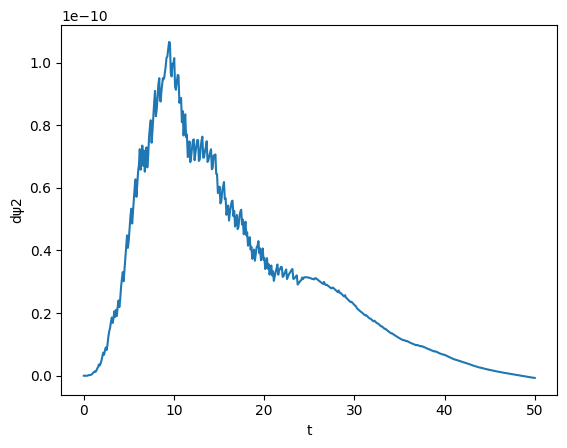

In [141]:
plt.plot(t,us.T[:,11*N+2] ,'-')
plt.xlabel('t')
plt.ylabel('dψ2')
plt.show()

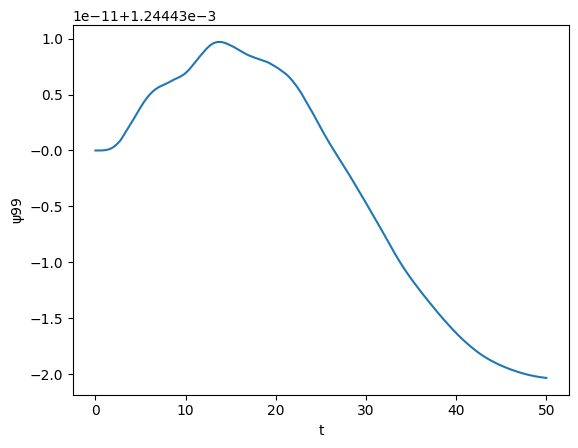

In [142]:
plt.plot(t,us.T[:,10*N + (N-1)] ,'-')
plt.xlabel('t')
plt.ylabel('ψ{}'.format(N-1))
plt.show()

In [143]:
X010=us.T[:,0*N:1*N]

In [144]:
Y010=us.T[:,2*N:3*N]

In [145]:
Z010=us.T[:,4*N:5*N]

In [146]:
simulation = np.stack([X010,Y010,Z010],axis=2) 

FPS = 30                      
frame_duration = 1000 / FPS

frames = []
for t in range(simulation.shape[0]):
    x = simulation[t,:,0]
    y = simulation[t,:,1]
    z = simulation[t,:,2]

    frames.append(go.Frame(
        data=[
            go.Scatter3d(
                x=x, y=y, z=z,
                mode="lines+markers",
                marker=dict(size=5, color=list(range(12)), colorscale="Viridis"),
                line=dict(width=4)
            )
        ],
        name=f"t={t}"
    ))

# First frame
x0, y0, z0 = simulation[0,:,0], simulation[0,:,1], simulation[0,:,2]

fig = go.Figure(
    data=[go.Scatter3d(x=x0, y=y0, z=z0, mode="lines+markers")],
    frames=frames
)

# Animation controls
fig.update_layout(
    title="Pipeline Simulation ",
    scene=dict(
        xaxis_title="X",
        yaxis_title="Y",
        zaxis_title="Z",
        xaxis=dict(range=[0, 300]),
        yaxis=dict(range=[-50, 50]),
        zaxis=dict(range=[0, 40]),
        aspectmode="data",
       
    ),
    updatemenus=[{
        "type": "buttons",
        "buttons": [
            {
                "label": "Play",
                "method": "animate",
                "args": [None, {"frame": {"duration": frame_duration, "redraw": True}}]
            },
            {
                "label": "Pause",
                "method": "animate",
                "args": [[None], {"frame": {"duration": 0}}]
            }
        ]
    }]
)

fig.show()